# Rainfall Prediction - Weather Forecasting:-

# Problem statement:-

             Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

Import all the required library.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# importing DataSet:-

In [3]:
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Data inspection & descriptions:-

In [6]:
df.shape

(8425, 23)

In [7]:
print('This dataset has {} observations with {} features.'.format(df.shape[0], df.shape[1]))

This dataset has 8425 observations with 23 features.


In [8]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

# EDA:-

In [9]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

We can see the Dataset contains object and float type of data.

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

we can see there are many missing values in our dataset.

In [13]:
#Checking unique values
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

These are the number of unique values present in each columns.

# Find catagorical & numerical data:-

In [14]:
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


We can see above are the list of categorical columns.

In [15]:
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


above are the list of numerical columns.

# Check value counts:-

In [16]:
for i in df[categorical_columns]:
    print(df[i].value_counts())
    print('*********************************************************************')

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
*********************************************************************
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
*********************************************************************
N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64
*********************************************************************
N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    43

In [17]:
for i in df[numerical_columns]:
    print(df[i].value_counts().sort_index())
    print('****************************************************************************')

-2.0     2
-1.7     1
-1.5     1
-1.4     1
-1.3     2
        ..
 27.5    2
 27.8    1
 28.0    1
 28.3    1
 28.5    1
Name: MinTemp, Length: 285, dtype: int64
****************************************************************************
8.2     1
8.3     1
8.4     1
8.8     2
9.4     1
       ..
43.5    1
43.6    2
44.8    1
44.9    1
45.5    2
Name: MaxTemp, Length: 331, dtype: int64
****************************************************************************
0.0      5299
0.1        28
0.2       406
0.4       177
0.5         7
         ... 
142.2       1
168.4       1
225.0       2
240.0       1
371.0       1
Name: Rainfall, Length: 250, dtype: int64
****************************************************************************
0.0      12
0.2      36
0.4      24
0.6      47
0.7       1
         ..
37.0      2
47.0      2
55.4      2
59.2      2
145.0     2
Name: Evaporation, Length: 116, dtype: int64
****************************************************************************
0.0   

# Feature Engineering:-

In [18]:
import datetime as dt

In [19]:
#convert dtae datatype object to datetime d_type
df["Date"]=pd.to_datetime(df["Date"])

In [20]:
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [21]:
#extracting date
df["Year"]=df["Date"].dt.year
df["Month"]=df["Date"].dt.month
df["Day"]=df["Date"].dt.day

In [22]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5


In [23]:
#now we have to dop the date column as we are extraced that column
df.drop(["Date"],axis=1)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1008.7,NaN,2.0,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1012.8,NaN,NaN,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1006.0,7.0,8.0,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1020.3,NaN,NaN,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1019.1,NaN,NaN,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1016.8,NaN,NaN,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,1016.5,3.0,2.0,15.1,26.0,No,No,2017,6,24


In [24]:
#lets check the unique values for date,month and year

In [25]:
df["Day"].value_counts().sort_index()

1     275
2     275
3     275
4     275
5     275
6     276
7     277
8     277
9     277
10    278
11    278
12    278
13    277
14    276
15    276
16    276
17    276
18    277
19    277
20    280
21    280
22    280
23    280
24    280
25    280
26    274
27    274
28    275
29    256
30    250
31    165
Name: Day, dtype: int64

In [26]:
df["Month"].value_counts().sort_index()

1     753
2     620
3     761
4     600
5     801
6     818
7     732
8     682
9     609
10    655
11    653
12    741
Name: Month, dtype: int64

In [27]:
df["Year"].value_counts().sort_index()

2008      93
2009    1238
2010    1443
2011    1468
2012     905
2013     543
2014     959
2015     653
2016     732
2017     391
Name: Year, dtype: int64

# Checking Null values in the DataFrame:-

In [28]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Year                0
Month               0
Day                 0
dtype: int64

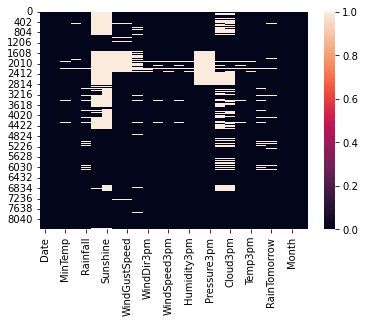

In [29]:
sns.heatmap(df.isnull())
plt.show()

we can see there are many missing values in our dataset.

In [30]:
#Now check columnwise


In [31]:
#for numerical columns
df[numerical_columns].isnull().sum()

MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustSpeed     991
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
dtype: int64

we can see there is many null values are present inside it

# Imputation Method to Replace Nan Values:-

In [32]:
df["Rainfall"] = df["Rainfall"].fillna(df["Rainfall"].median())
df["Evaporation"] = df["Evaporation"].fillna(df["Evaporation"].median())
df["WindGustSpeed"] = df["WindGustSpeed"].fillna(df["WindGustSpeed"].median())
df["WindSpeed9am"] = df["WindSpeed9am"].fillna(df["WindSpeed9am"].median())

In [33]:
df["MinTemp"] = df["MinTemp"].fillna(df["MinTemp"].mean())
df["MaxTemp"] = df["MaxTemp"].fillna(df["MaxTemp"].mean())
df["Sunshine"] = df["Sunshine"].fillna(df["Sunshine"].mean())
df["WindSpeed3pm"] = df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mean())
df["Humidity9am"] = df["Humidity9am"].fillna(df["Humidity9am"].mean())
df["Humidity3pm"] = df["Humidity3pm"].fillna(df["Humidity3pm"].mean())

In [34]:
df["Pressure9am"] = df["Pressure9am"].fillna(df["Pressure9am"].mean())
df["Pressure3pm"] = df["Pressure3pm"].fillna(df["Pressure3pm"].mean())
df["Cloud9am"] = df["Cloud9am"].fillna(df["Cloud9am"].mean())
df["Cloud3pm"] = df["Cloud3pm"].fillna(df["Cloud3pm"].mean())
df["Temp9am"] = df["Temp9am"].fillna(df["Temp9am"].mean())
df["Temp3pm"] = df["Temp3pm"].fillna(df["Temp3pm"].mean())

In [35]:
df[numerical_columns].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

we can see no there is n null values are present after imputing

In [37]:
#for catagorical columns
df[categorical_columns].isnull().sum()

Date              0
Location          0
WindGustDir     991
WindDir9am      829
WindDir3pm      308
RainToday       240
RainTomorrow    239
dtype: int64

As we can see there also 5 columns who have null values

In [38]:
df["WindGustDir"] = df["WindGustDir"].fillna(df["WindGustDir"].mode()[0])
df["WindDir9am"] = df["WindDir9am"].fillna(df["WindDir9am"].mode()[0])
df["WindDir3pm"] = df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0])
df["RainToday"] = df["RainToday"].fillna(df["RainToday"].mode()[0])
df["RainTomorrow"] = df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0])

In [39]:
df[categorical_columns].isnull().sum()

Date            0
Location        0
WindGustDir     0
WindDir9am      0
WindDir3pm      0
RainToday       0
RainTomorrow    0
dtype: int64

there is also no null values are present after imputing

In [40]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

no null values in our dataset

<AxesSubplot:>

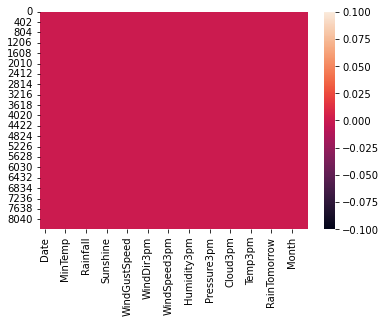

In [41]:
sns.heatmap(df.isnull())

as we can see in above seamap there is n null values are present

# Data Describe:-

In [43]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Year,Month,Day
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.725982,5.060332,7.632205,40.036320,13.840000,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,2012.102433,6.442136,15.741958
std,5.379488,6.114516,10.319872,3.871619,2.825451,13.781296,10.128896,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,2.473137,3.437994,8.787354
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,2008.000000,1.000000,1.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,2010.000000,3.000000,8.000000
50%,13.200000,23.300000,0.000000,4.600000,7.632205,39.000000,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,2011.000000,6.000000,16.000000
75%,17.300000,28.000000,0.800000,5.200000,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,2014.000000,9.000000,23.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,2017.000000,12.000000,31.000000


<AxesSubplot:>

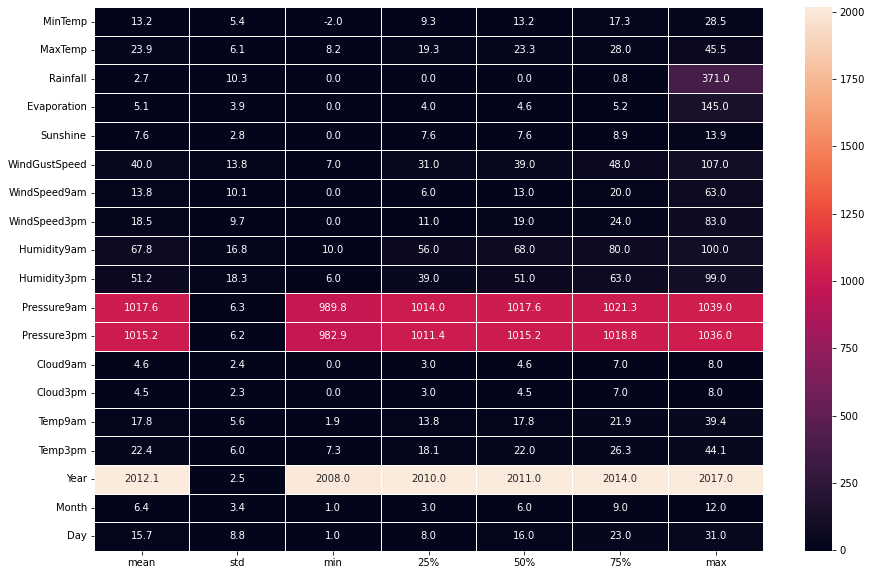

In [58]:
plt.figure(figsize=(15,10))
sns.heatmap(round(df.describe()[1:].transpose(),2),linewidth=1,annot=True,fmt='.1f')

-we have Outliers in the dataset.

# Data Visualization:-

# Univariate Analysis:-

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


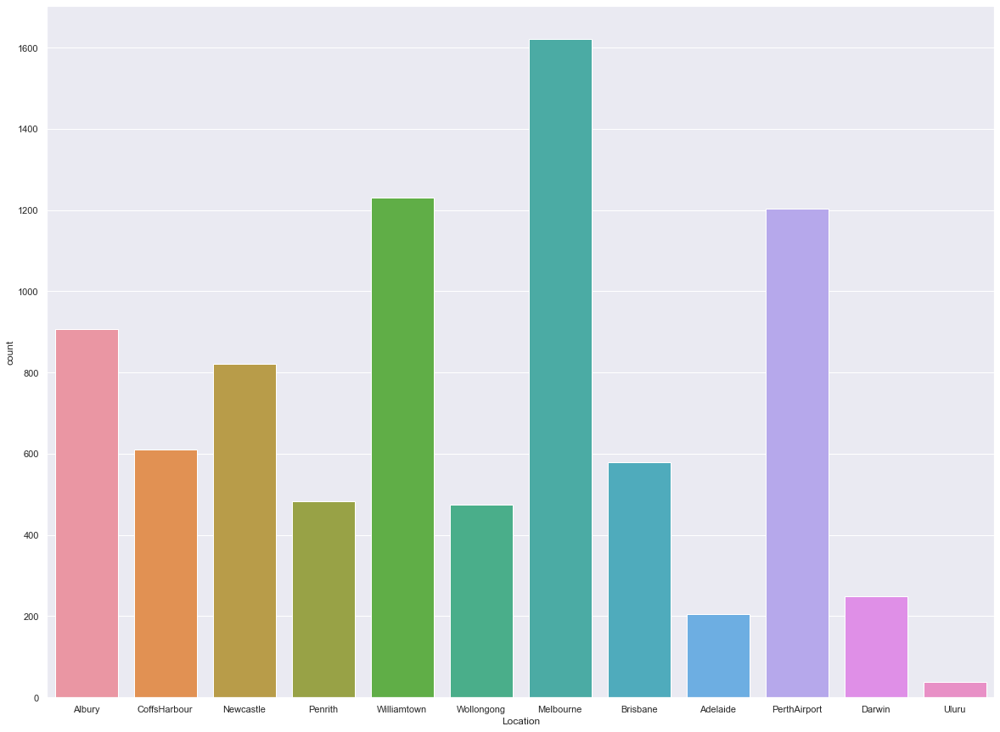

In [85]:
plt.figure(figsize=(20,15))
print(df["Location"].value_counts())  
sns.countplot(df["Location"])
plt.show()

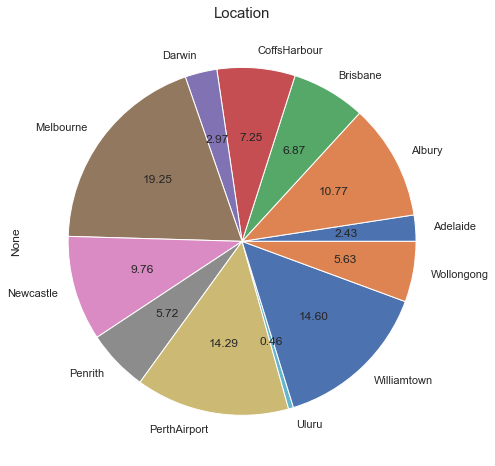

In [86]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby("Location").size().plot(kind='pie', autopct='%.2f')
plt.title("Location", fontsize=15)
plt.show()

Here among all locations Melbourne ,Williamtown,PerthAirport are highest counts of wheather stations accorfdingly and Uluru has the least data in my dataset.

N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


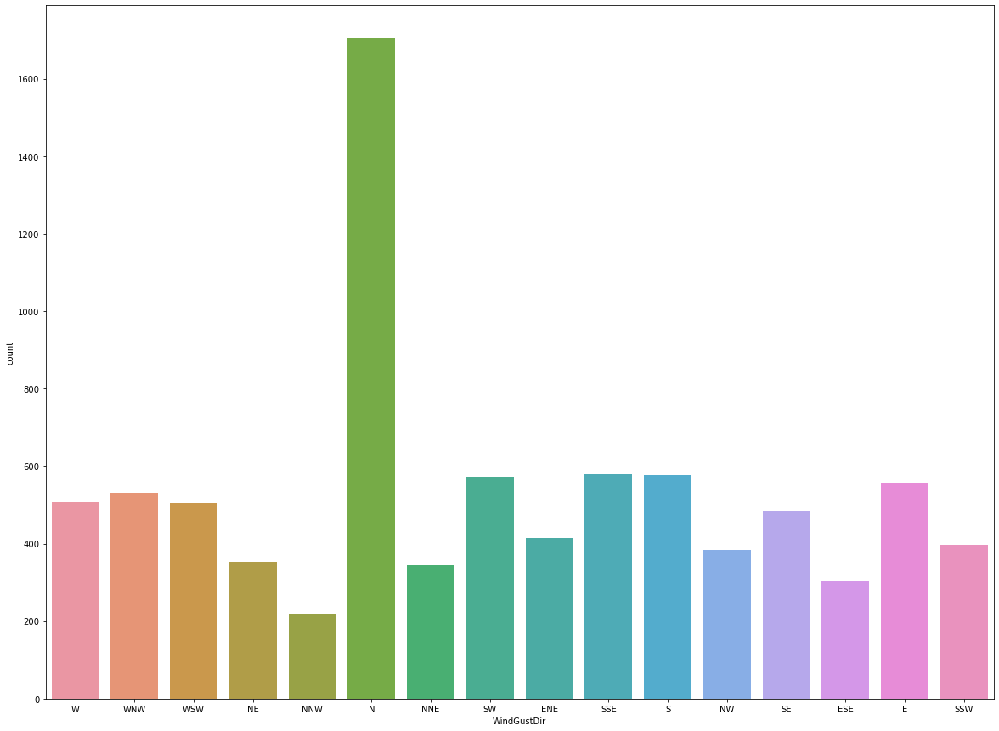

In [64]:
plt.figure(figsize=(20,15))
print(df["WindGustDir"].value_counts())  
sns.countplot(df["WindGustDir"])
plt.show()

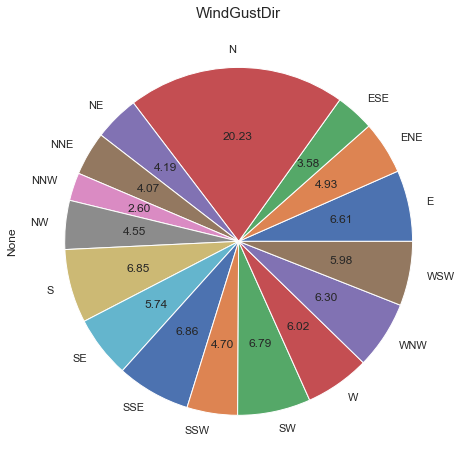

In [84]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby("WindGustDir").size().plot(kind='pie', autopct='%.2f')
plt.title("WindGustDir", fontsize=15)
plt.show()

As we can see N is the highest direction of the strongest wind gust in the 24 hours to midnight,which is 20.23% of all

N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


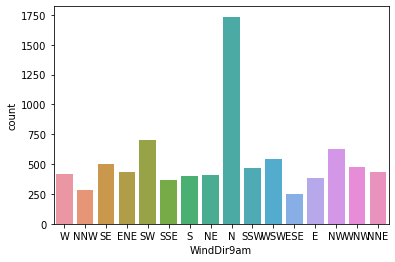

In [65]:
print(df["WindDir9am"].value_counts())  
sns.countplot(df["WindDir9am"])
plt.show()

Here also we can see N is the highest count of 1735,of Direction of the wind at 9am

SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
W       462
ESE     462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


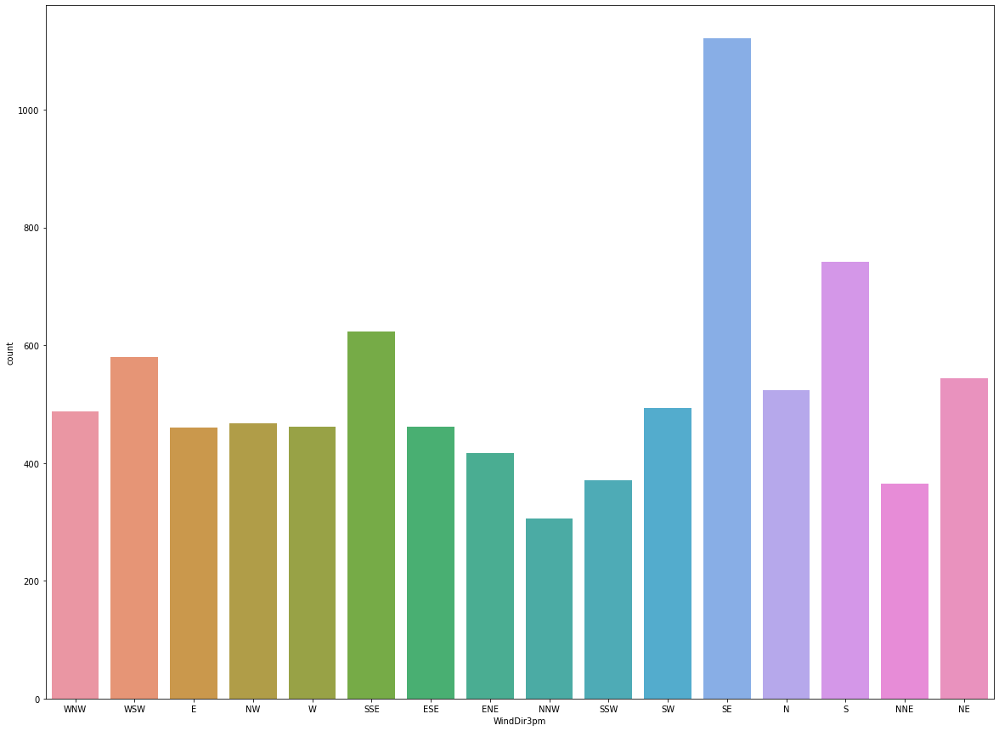

In [68]:
plt.figure(figsize=(20,15))
print(df["WindDir3pm"].value_counts())  
sns.countplot(df["WindDir3pm"])
plt.show()

Direction of the wind at 3pm is highest in SE which counts 1121

No     6435
Yes    1990
Name: RainToday, dtype: int64


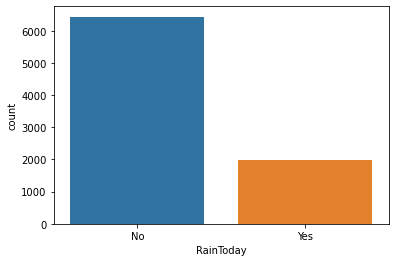

In [70]:
print(df["RainToday"].value_counts())  
sns.countplot(df["RainToday"])
plt.show()

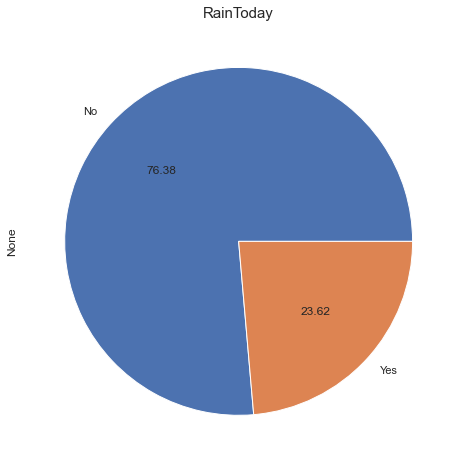

In [83]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby('RainToday').size().plot(kind='pie', autopct='%.2f')
plt.title('RainToday', fontsize=15)
plt.show()

Here we can see Most of the time there is NO rain today

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64


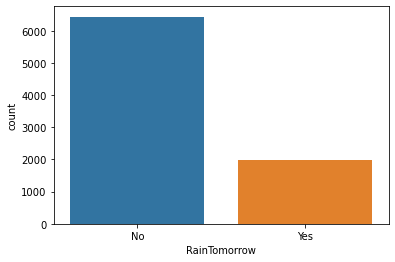

In [71]:
print(df["RainTomorrow"].value_counts())  
sns.countplot(df["RainTomorrow"])
plt.show()

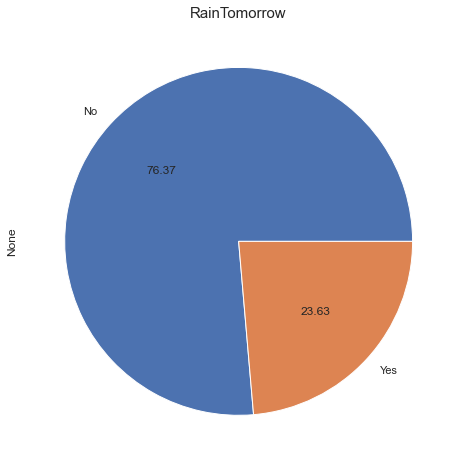

In [82]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(20,8))
plt.subplot(1,2,2)
df.groupby('RainTomorrow').size().plot(kind='pie', autopct='%.2f')
plt.title('RainTomorrow', fontsize=15)
plt.show()

here we can see No Rain predicted for tomorrow which is 76.37%.

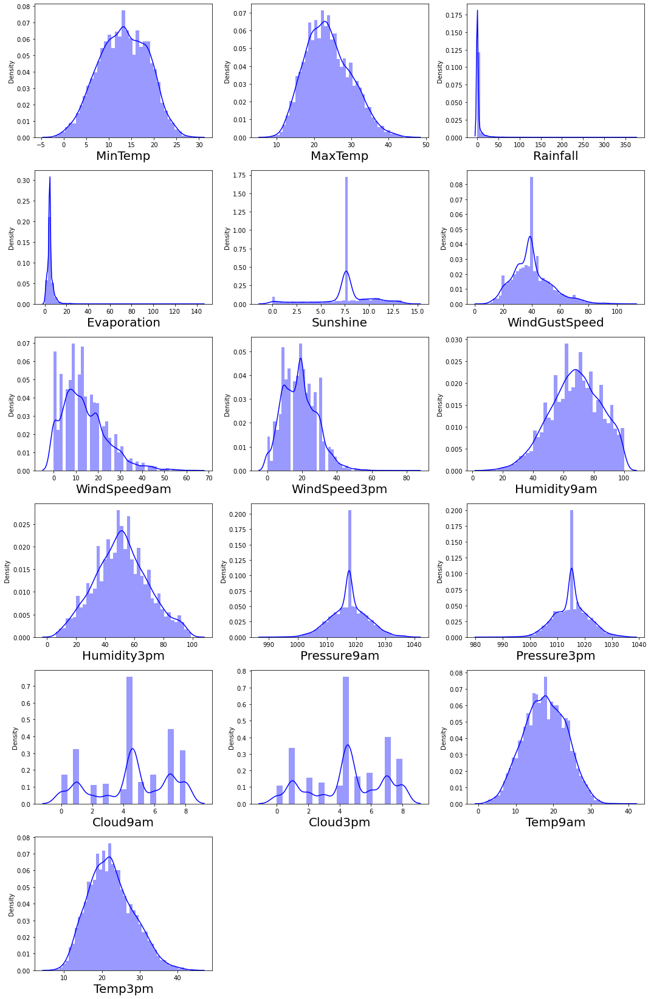

In [81]:
plt.figure(figsize=(15,30),facecolor='white')
plotnumber=1
for column in numerical_columns:
    if plotnumber<=24:
        ax=plt.subplot(8,3,plotnumber)
        sns.distplot(df[column],color="blue")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

-As we can see most of the columns are normally distributed
-Rainfall, Evaporation and Windspeed9am are right skewed.

# Bivariate Analysis:-

<AxesSubplot:xlabel='Location', ylabel='count'>

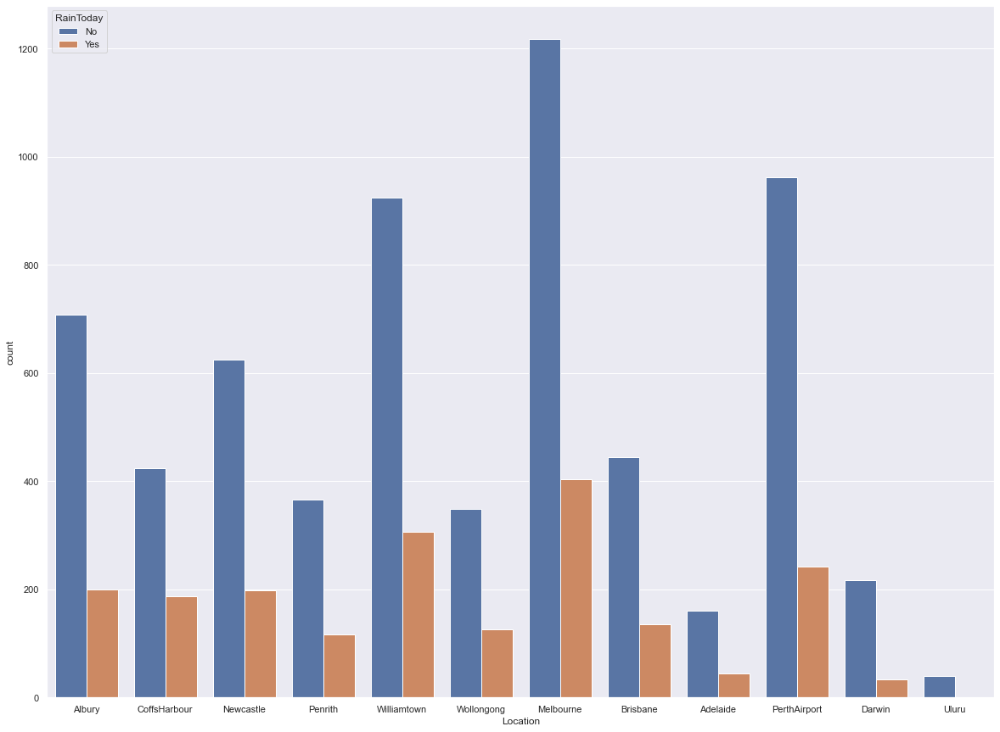

In [88]:
plt.figure(figsize = (20,15))
sns.countplot(x='Location',hue='RainToday',data=df)

The rate of Rainfall predicted for today is more for Melbourne and least for Uluru

<AxesSubplot:xlabel='Location', ylabel='count'>

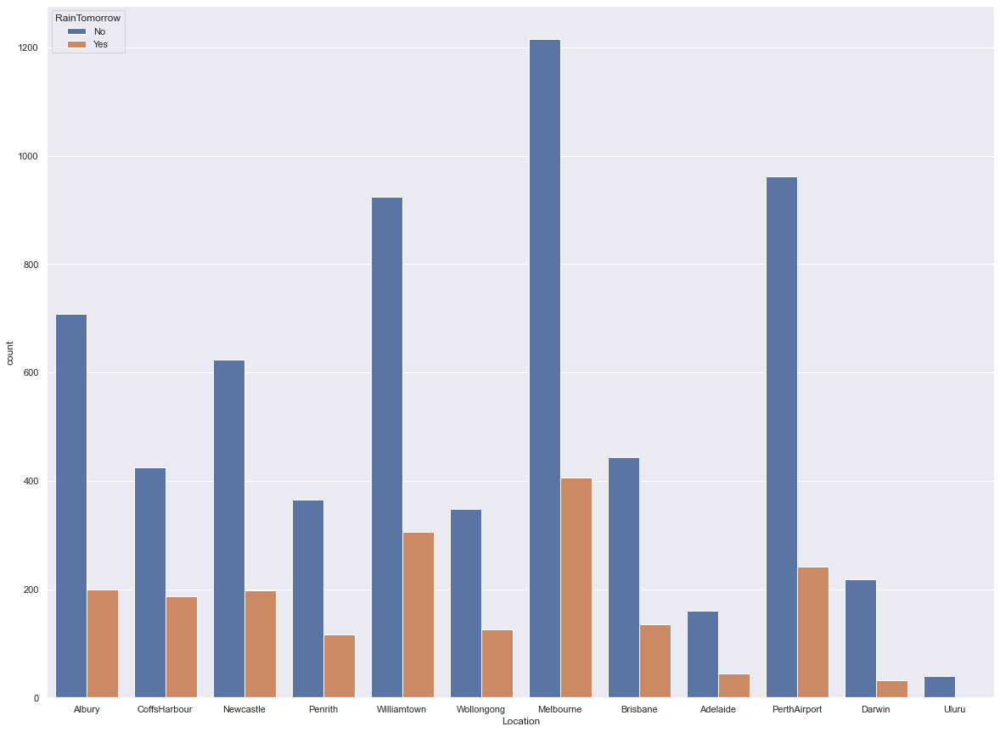

In [95]:
plt.figure(figsize = (20,15))
sns.countplot(x='Location',hue='RainTomorrow',data=df)

he rate of Rainfall predicted for tomorrow is more for Melbourne and least for Uluru

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

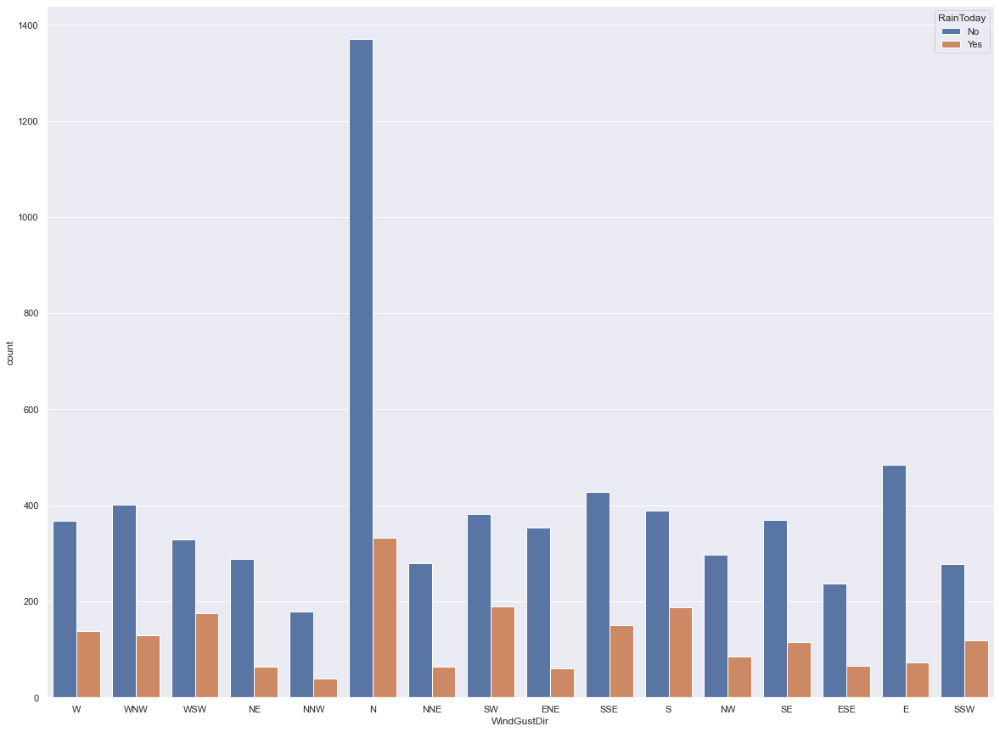

In [89]:
plt.figure(figsize = (20,15))
sns.countplot(x='WindGustDir',hue='RainToday',data=df)

The rainfall rate is the most when the WindGustdirection is N

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

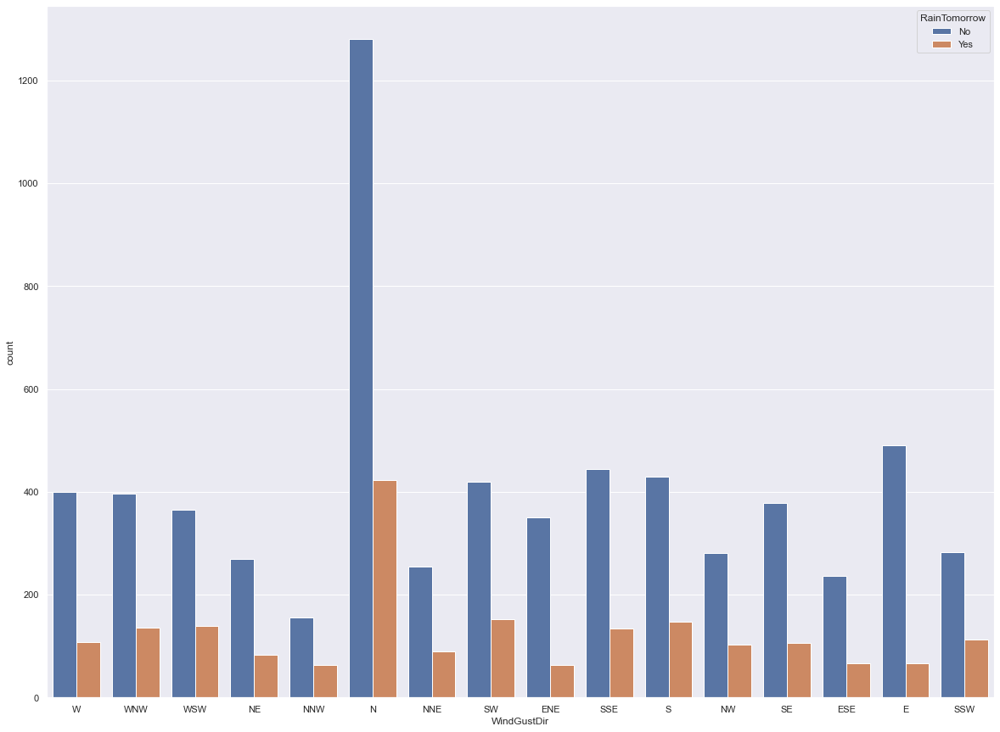

In [97]:
plt.figure(figsize = (20,15))
sns.countplot(x='WindGustDir',hue='RainTomorrow',data=df)

The rainfall rate is the most when the WindGustdirection is N

<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

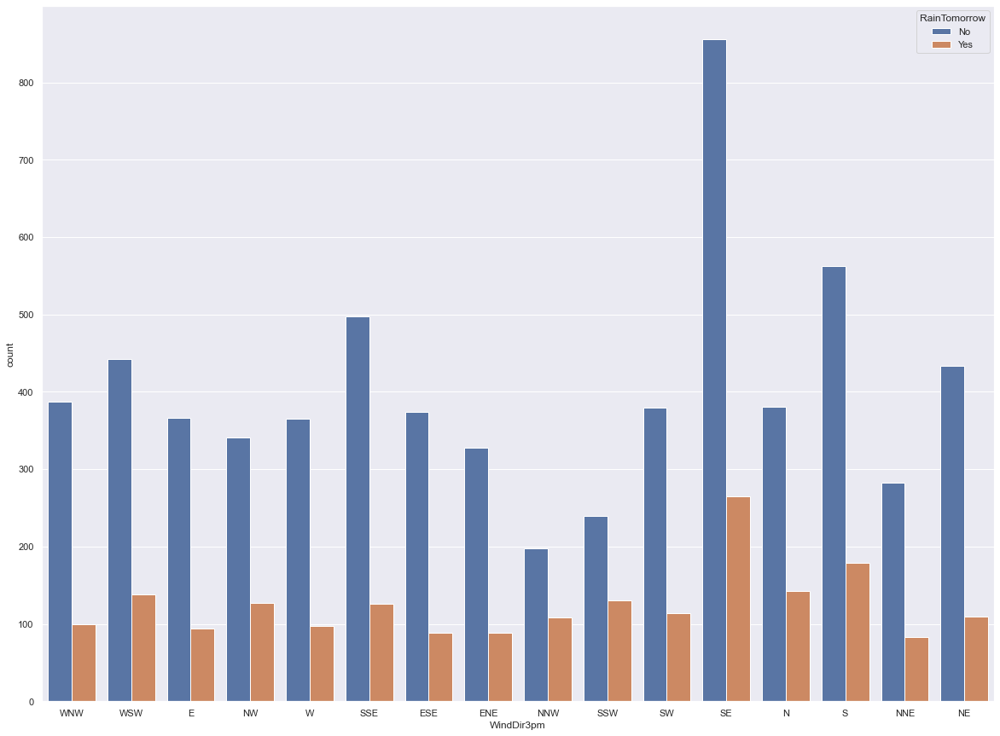

In [111]:
plt.figure(figsize = (20,15))
sns.countplot(x='WindDir3pm',hue='RainTomorrow',data=df)

<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

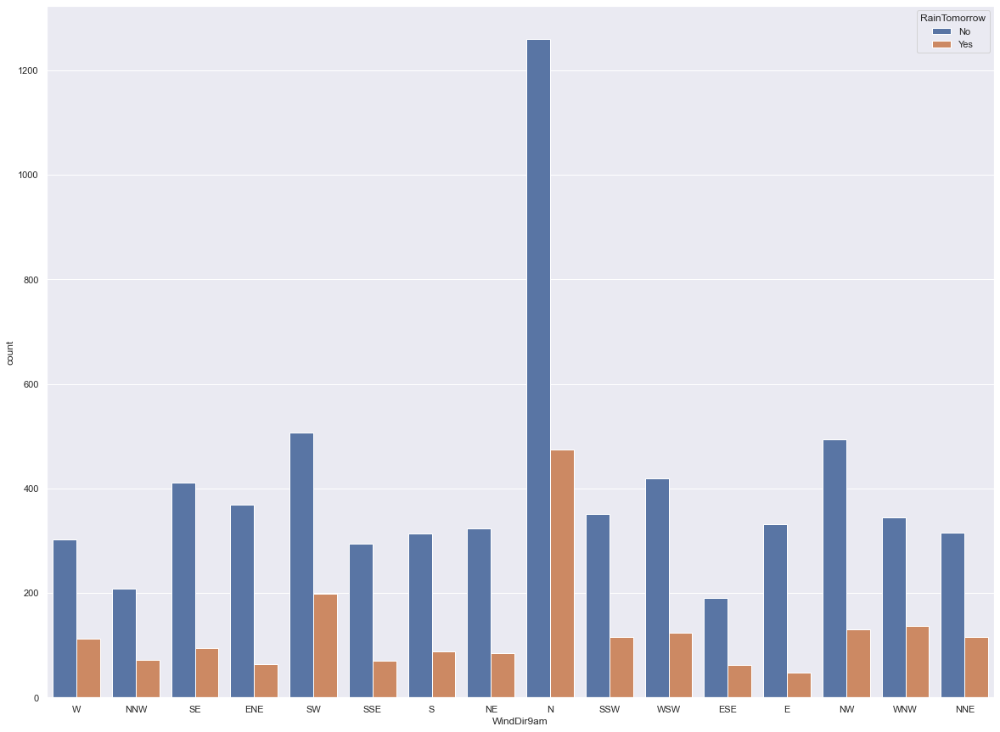

In [110]:
plt.figure(figsize = (20,15))
sns.countplot(x='WindDir9am',hue='RainTomorrow',data=df)

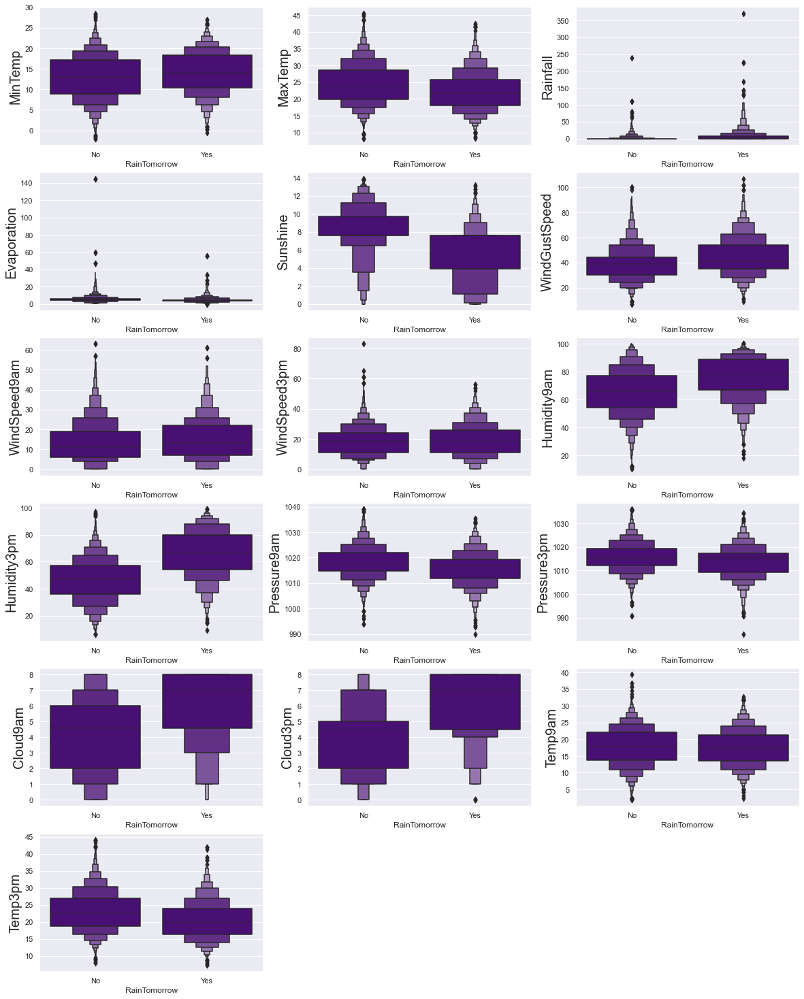

In [103]:
plt.figure(figsize=(20,35), facecolor='white')
plotnumber = 1

for i in df[numerical_columns]:
    if plotnumber<=24 :
        ax = plt.subplot(8,3,plotnumber)
        sns.boxenplot(x=df.RainTomorrow,y=df[i],color='indigo')
        plt.ylabel(i,fontsize=20)
       
    plotnumber+=1
plt.show()

<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

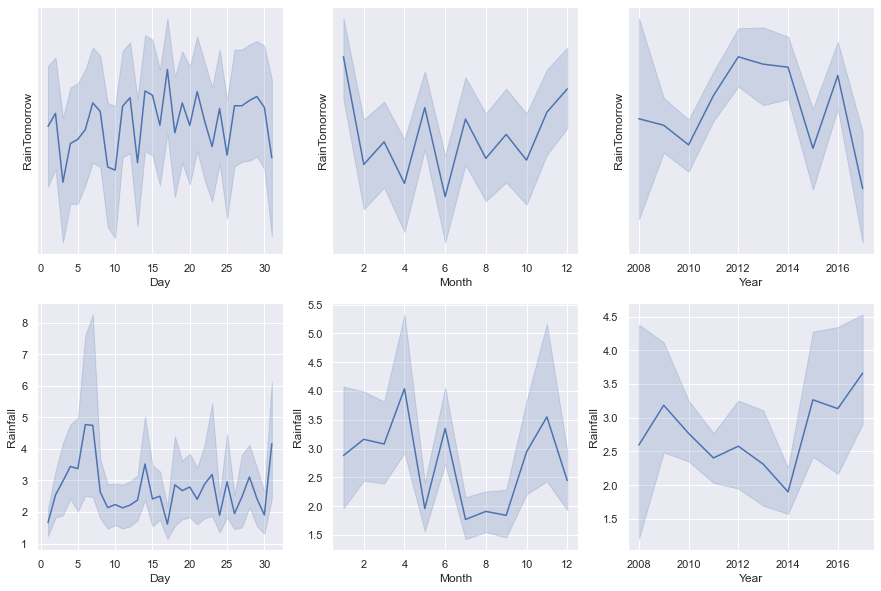

In [105]:
fig,axes=plt.subplots(2,3,figsize=(15,10))

#checking the relation between Day and RainTomorrow
sns.lineplot(x='Day',y='RainTomorrow',ax=axes[0,0],data=df)

#checking the relation between Month and RainTomorrow
sns.lineplot(x='Month',y='RainTomorrow',ax=axes[0,1],data=df)

#checking the relation between Year and RainTomorrow
sns.lineplot(x='Year',y='RainTomorrow',ax=axes[0,2],data=df)

#checking the relation between Day and Rainfall
sns.lineplot(x='Day',y='Rainfall',ax=axes[1,0],data=df)

#checking the relation between Month and Rainfall
sns.lineplot(x='Month',y='Rainfall',ax=axes[1,1],data=df)

#checking the relation between Year and Rainfall
sns.lineplot(x='Year',y='Rainfall',ax=axes[1,2],data=df)

As we can see there is no specific pattern between Raintomorrow and day, month and year.Although April, June and November has the highest Rainfall.

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

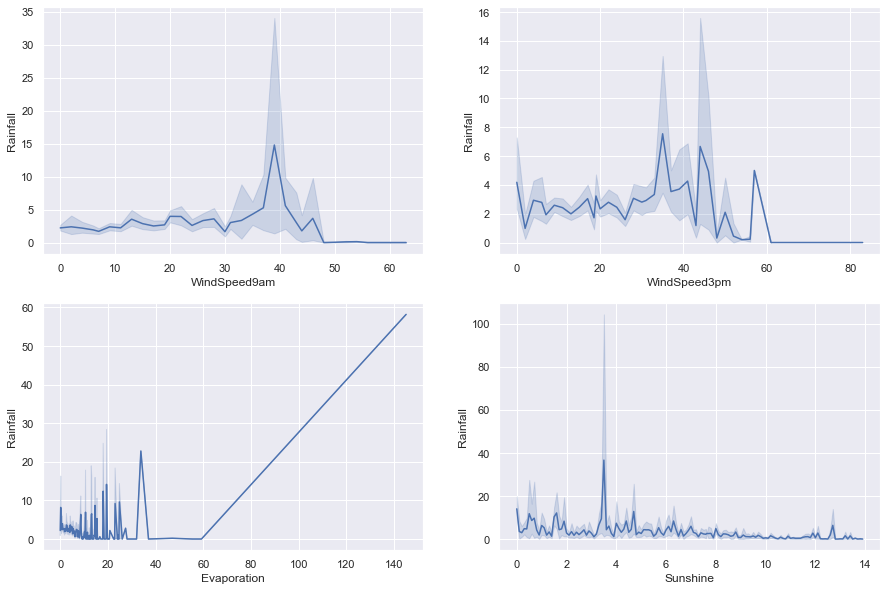

In [107]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between WindSpeed9am and Rainfall
sns.lineplot(x='WindSpeed9am',y='Rainfall',ax=axes[0,0],palette="OrRd",data=df)

#checking the relation between WindSpeed3pm and Rainfall
sns.lineplot(x='WindSpeed3pm',y='Rainfall',ax=axes[0,1],palette="OrRd",data=df)
#checking the relation between Evaporation and Rainfall
sns.lineplot(x='Evaporation',y='Rainfall',ax=axes[1,0],palette="OrRd",data=df)

#checking the relation between Sunshine and Rainfall
sns.lineplot(x='Sunshine',y='Rainfall',ax=axes[1,1],palette="OrRd",data=df)

As we can see n the morning, at Windspeed between 30 to 40 km/h the rainfall is more.
In the evening, at Windspeed and rainfall pattern varies.
We can see that Evaporation and rainfall is correlated highly.
when sunshine is low there is more rainfall.

# Multivariate Analysis:-

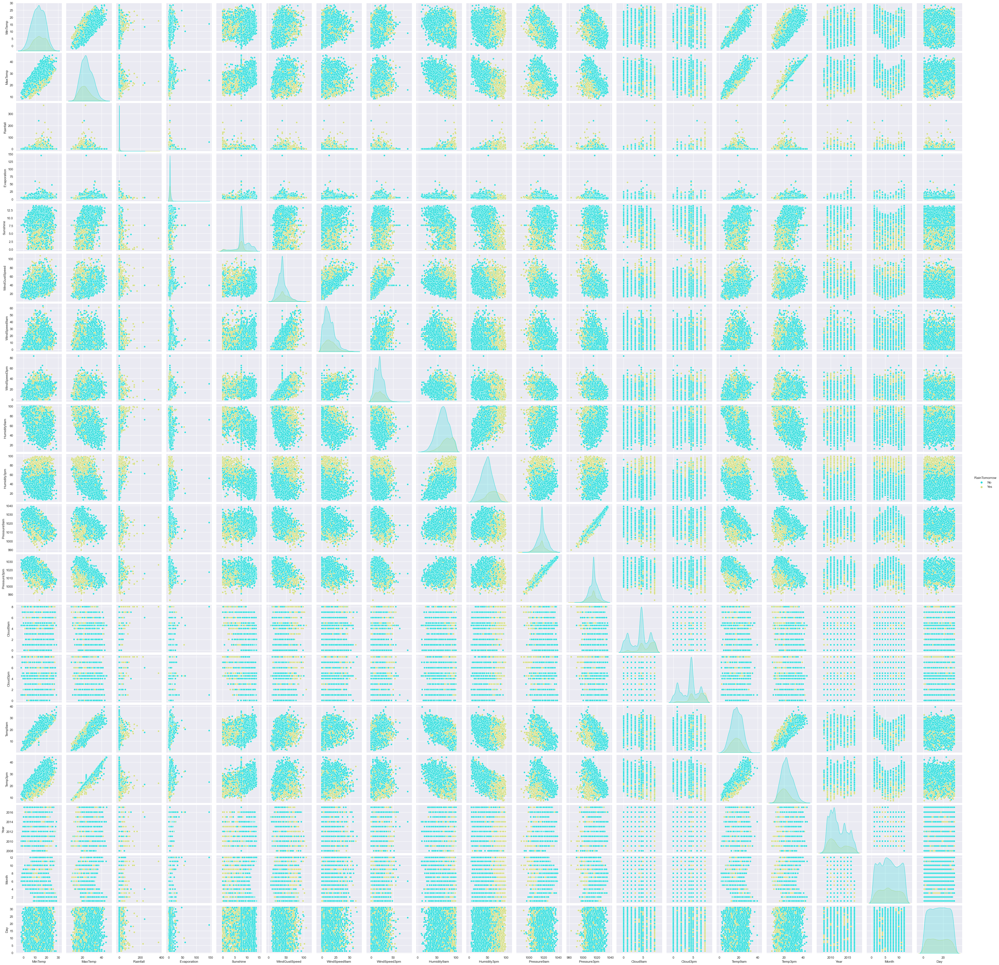

In [109]:
sns.pairplot(df,hue="RainTomorrow",palette="rainbow")

Here we can see some linear relation between target and variables.

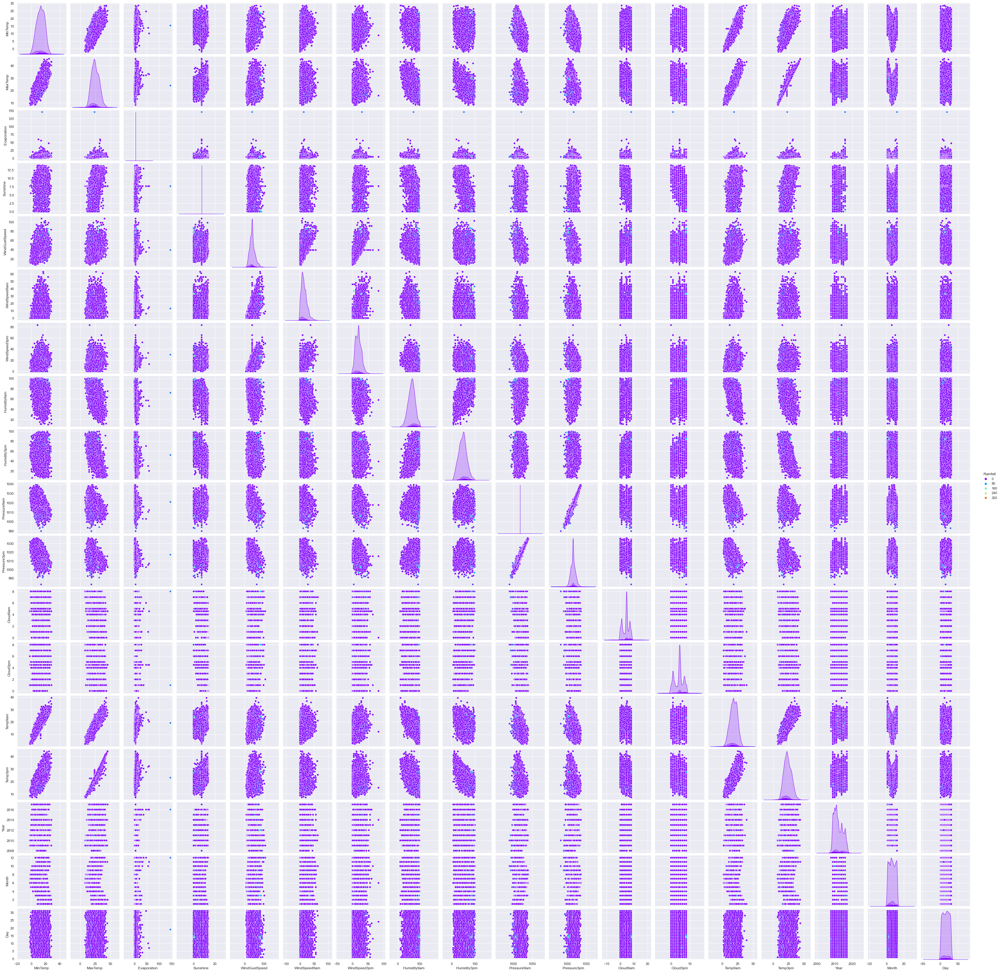

In [112]:
sns.pairplot(df,hue="Rainfall",palette="rainbow")

# Checking Outliers:-

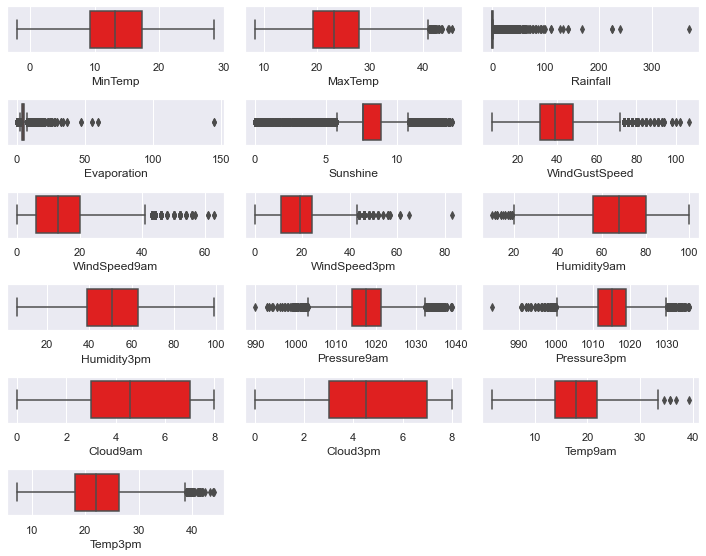

In [119]:
plt.figure(figsize=(10,10),facecolor='white')
plotnumber=1
for column in numerical_columns:
    if plotnumber<=24:
        ax=plt.subplot(8,3,plotnumber)
        sns.boxplot(df[column],color="red")
        plt.xlabel(column,fontsize=12)
    plotnumber+=1
plt.tight_layout()

MinTemp             AxesSubplot(0.125,0.749828;0.133621x0.130172)
MaxTemp          AxesSubplot(0.285345,0.749828;0.133621x0.130172)
Rainfall          AxesSubplot(0.44569,0.749828;0.133621x0.130172)
Evaporation      AxesSubplot(0.606034,0.749828;0.133621x0.130172)
Sunshine         AxesSubplot(0.766379,0.749828;0.133621x0.130172)
WindGustSpeed       AxesSubplot(0.125,0.593621;0.133621x0.130172)
WindSpeed9am     AxesSubplot(0.285345,0.593621;0.133621x0.130172)
WindSpeed3pm      AxesSubplot(0.44569,0.593621;0.133621x0.130172)
Humidity9am      AxesSubplot(0.606034,0.593621;0.133621x0.130172)
Humidity3pm      AxesSubplot(0.766379,0.593621;0.133621x0.130172)
Pressure9am         AxesSubplot(0.125,0.437414;0.133621x0.130172)
Pressure3pm      AxesSubplot(0.285345,0.437414;0.133621x0.130172)
Cloud9am          AxesSubplot(0.44569,0.437414;0.133621x0.130172)
Cloud3pm         AxesSubplot(0.606034,0.437414;0.133621x0.130172)
Temp9am          AxesSubplot(0.766379,0.437414;0.133621x0.130172)
Temp3pm   

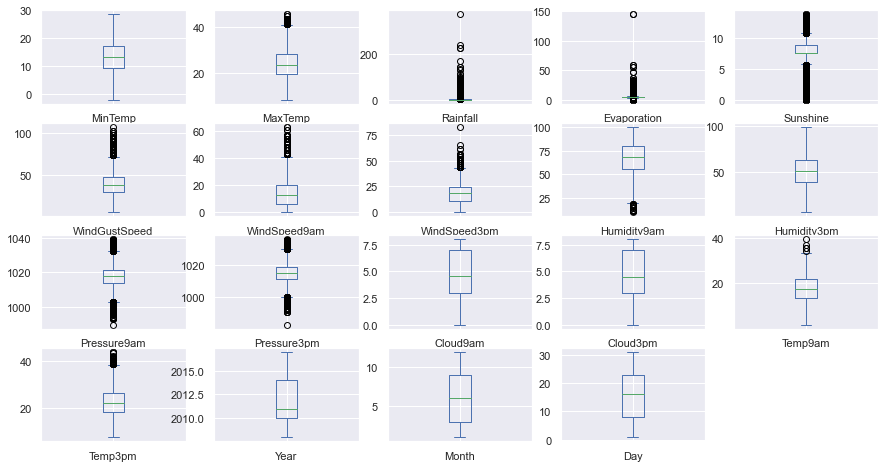

In [120]:
df.plot(kind='box',subplots=True,layout=(5,5),figsize=(15,10))

we can see there are many outliers are present

# Removing outliers:-

In [121]:
features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

In [122]:
from scipy.stats import zscore

In [123]:
z=np.abs(zscore(features))
z

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,1.570089e-01,0.206021,0.118906,1.257472e-15,0.287630,0.608197,0.563297,0.189439,1.584003,1.308665,0.153712,0.108138
1,2.028121e-01,0.264165,0.118906,1.257472e-15,0.287630,0.971536,0.357200,1.420268,1.121880,1.196072,0.100217,0.312348
2,3.009450e-01,0.264165,0.118906,1.257472e-15,0.432763,0.509464,0.769394,1.777981,1.599939,1.051309,0.577390,0.127334
3,6.771214e-01,0.264165,0.118906,1.257472e-15,1.163698,0.280403,0.982428,1.360650,0.006411,0.391836,0.060269,0.682376
4,1.380408e+00,0.167258,0.118906,1.257472e-15,0.069931,0.675336,0.151104,0.845246,1.090010,1.485596,0.006773,1.220599
...,...,...,...,...,...,...,...,...,...,...,...,...
8420,7.523137e-02,0.264165,0.118906,1.257472e-15,0.655733,0.082936,0.776331,1.002937,1.109058,0.814518,1.366273,0.007221
8421,2.355231e-01,0.264165,0.118906,1.257472e-15,1.308831,0.082936,0.982428,0.704843,0.933770,0.621501,1.223619,0.345987
8422,4.972110e-01,0.264165,0.118906,1.257472e-15,0.220335,0.477869,0.982428,0.883699,0.535388,0.251553,0.938310,0.615099
8423,5.135665e-01,0.264165,0.118906,1.257472e-15,0.873433,0.082936,1.188525,1.002937,0.280424,0.203299,0.474684,0.598279


In [124]:
df_new=df[(z<3).all(axis=1)]
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.900000,0.6,4.6,7.632205,W,44.0,W,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.100000,0.0,4.6,7.632205,WNW,44.0,NNW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.700000,0.0,4.6,7.632205,WSW,46.0,W,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.000000,0.0,4.6,7.632205,NE,24.0,SE,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.300000,1.0,4.6,7.632205,W,41.0,ENE,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,4.6,7.632205,E,31.0,SE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,21
8421,2017-06-22,Uluru,3.6,25.300000,0.0,4.6,7.632205,NNW,22.0,SE,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,22
8422,2017-06-23,Uluru,5.4,26.900000,0.0,4.6,7.632205,N,37.0,SE,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,23
8423,2017-06-24,Uluru,7.8,27.000000,0.0,4.6,7.632205,SE,28.0,SSE,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [125]:
df.shape

(8425, 26)

Before removing the outliers we had 8425 rows and 26 columns.

In [126]:
df_new.shape

(7987, 26)

After removing the outliers we have 7987 rows and 26 columns.

# % of data loss:-

In [128]:
data_loss = (8425-7987)/8425*100
data_loss

5.198813056379822

Using Zscore i have lost 5.19% of data.

Which is less than 10% so we consider this.

# Checking Skewness:-

In [131]:
df_new.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.519090
Evaporation      1.280696
Sunshine        -0.723970
WindGustSpeed    0.539852
WindSpeed9am     0.713786
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Year             0.430100
Month            0.054460
Day              0.002731
dtype: float64

We have skewness in Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am.

# Removing skewness using yeo_johnson method:-

In [132]:
skew=["Rainfall", "Evaporation", "Sunshine", "WindGustSpeed", "WindSpeed9am"]

In [133]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [134]:
df_new[skew] = scaler.fit_transform(df_new[skew].values)

In [136]:
df_new[skew].head()

,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am
0,0.773058,0.033069,-0.097439,0.448790,0.785250
1,-0.654231,0.033069,-0.097439,0.448790,-0.982717
2,-0.654231,0.033069,-0.097439,0.593637,0.701237
3,-0.654231,0.033069,-0.097439,-1.250093,-0.062332
4,1.135607,0.033069,-0.097439,0.224831,-0.540338


In [138]:
df_new.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         1.040980
Evaporation      0.061105
Sunshine        -0.066262
WindGustSpeed    0.004523
WindSpeed9am    -0.110908
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Year             0.430100
Month            0.054460
Day              0.002731
dtype: float64

As we can see we still have skewness in Rainfall

In [139]:
df_new["Rainfall"] = np.log1p(df_new["Rainfall"])

In [140]:
df_new.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         0.845049
Evaporation      0.061105
Sunshine        -0.066262
WindGustSpeed    0.004523
WindSpeed9am    -0.110908
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
Year             0.430100
Month            0.054460
Day              0.002731
dtype: float64

now we can see the skewness of Rainfall decrease

In [141]:
#After removing skewness let's check how the data has been distributed in all columns.

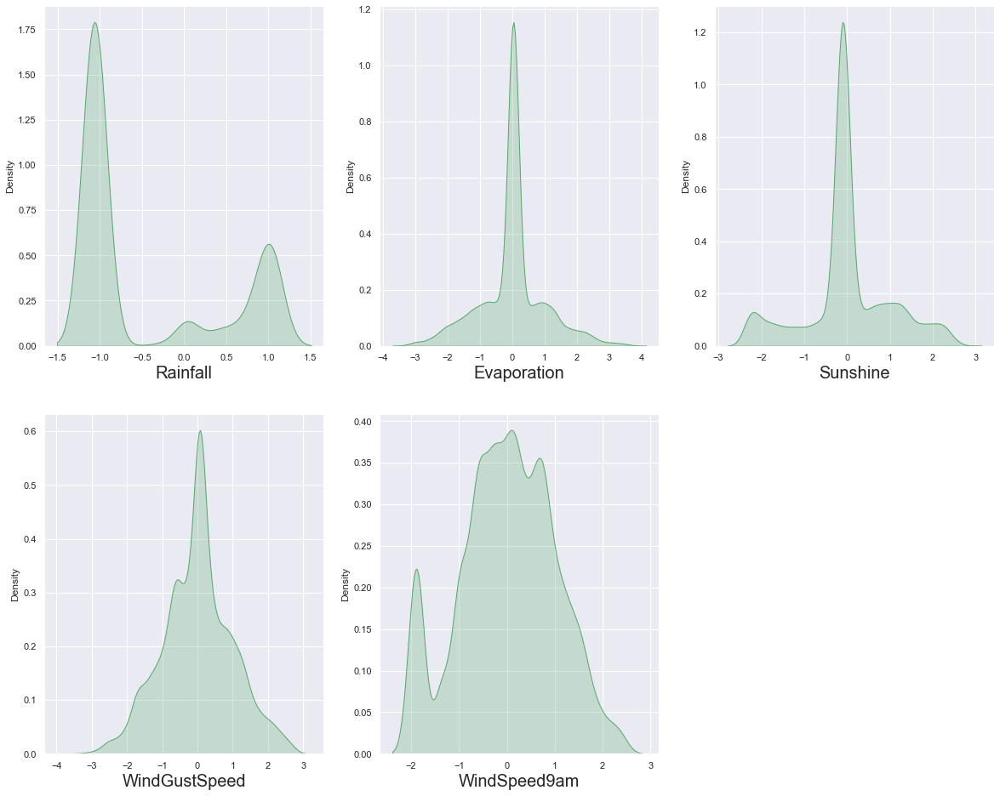

In [144]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df_new[skew]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df_new[column],color='g',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

as e can see We have removed skewness at the maximum.

# Encoding the data:-

In [145]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [147]:
for i in categorical_columns:
    df_new[i]=enc.fit_transform(df_new[i].values.reshape(-1,1))

In [148]:
df_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,0.0,1.0,13.4,22.900000,0.572706,0.033069,-0.097439,13.0,0.448790,13.0,...,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0,2008,12,1
1,1.0,1.0,7.4,25.100000,-1.061985,0.033069,-0.097439,14.0,0.448790,6.0,...,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0,2008,12,2
2,2.0,1.0,12.9,25.700000,-1.061985,0.033069,-0.097439,15.0,0.593637,13.0,...,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0,2008,12,3
3,3.0,1.0,9.2,28.000000,-1.061985,0.033069,-0.097439,4.0,-1.250093,9.0,...,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0,2008,12,4
4,4.0,1.0,17.5,32.300000,0.758751,0.033069,-0.097439,13.0,0.224831,1.0,...,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2931.0,9.0,2.8,23.400000,-1.061985,0.033069,-0.097439,0.0,-0.591948,9.0,...,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0,2017,6,21
8421,2932.0,9.0,3.6,25.300000,-1.061985,0.033069,-0.097439,6.0,-1.456067,9.0,...,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0,2017,6,22
8422,2933.0,9.0,5.4,26.900000,-1.061985,0.033069,-0.097439,3.0,-0.087700,9.0,...,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0,2017,6,23
8423,2934.0,9.0,7.8,27.000000,-1.061985,0.033069,-0.097439,9.0,-0.863369,10.0,...,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0,2017,6,24


# Checking Correlation:-

In [150]:
cor=df_new.corr()
cor

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Date,1.000000,0.465769,0.012391,0.103263,0.008921,0.100504,0.026397,-0.094026,-0.028709,-0.034627,...,0.019223,0.003365,-0.002297,0.067901,0.116206,-0.008830,-0.003565,0.992825,0.024646,0.006392
Location,0.465769,1.000000,0.116694,0.063798,0.009639,0.110101,0.039174,-0.037707,0.256093,-0.041030,...,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222,0.481143,-0.086011,-0.004978
MinTemp,0.012391,0.116694,1.000000,0.718598,0.052980,0.392350,0.087866,-0.154935,0.249668,-0.045231,...,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021,0.040001,-0.247066,0.010924
MaxTemp,0.103263,0.063798,0.718598,1.000000,-0.256299,0.488844,0.403083,-0.237955,0.151581,-0.217160,...,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708,0.120204,-0.164351,0.017068
Rainfall,0.008921,0.009639,0.052980,-0.256299,1.000000,-0.207855,-0.266296,0.134170,0.062402,0.155621,...,-0.021809,0.302834,0.271987,-0.120315,-0.266349,0.878298,0.307088,0.009945,-0.005659,-0.018813
Evaporation,0.100504,0.110101,0.392350,0.488844,-0.207855,1.000000,0.411843,-0.112642,0.196884,-0.094571,...,-0.281996,-0.134010,-0.163262,0.467829,0.473297,-0.172497,-0.093593,0.103405,-0.039374,0.013640
Sunshine,0.026397,0.039174,0.087866,0.403083,-0.266296,0.411843,1.000000,-0.112272,0.032268,-0.082335,...,-0.074037,-0.543857,-0.555038,0.285620,0.418462,-0.223070,-0.315207,0.024638,0.001092,0.004631
WindGustDir,-0.094026,-0.037707,-0.154935,-0.237955,0.134170,-0.112642,-0.112272,1.000000,0.010467,0.405681,...,-0.008263,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378,-0.096042,0.038044,0.017003
WindGustSpeed,-0.028709,0.256093,0.249668,0.151581,0.062402,0.196884,0.032268,0.010467,1.000000,-0.061313,...,-0.331119,0.009512,0.059854,0.220355,0.117052,0.076552,0.172511,-0.032144,0.046758,-0.005065
WindDir9am,-0.034627,-0.041030,-0.045231,-0.217160,0.155621,-0.094571,-0.082335,0.405681,-0.061313,1.000000,...,0.081400,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091,-0.034468,0.018344,-0.010014


This gives the correlation between the denpendent and independent variables

<AxesSubplot:>

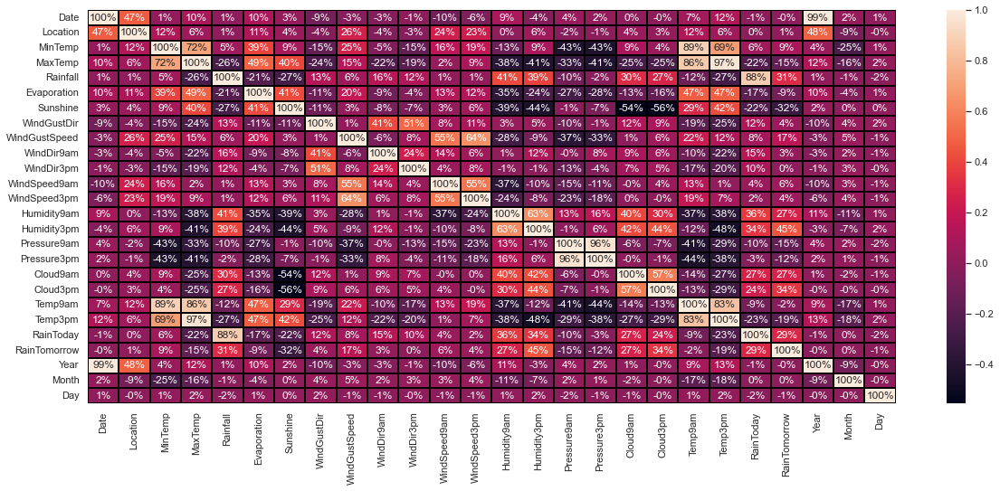

In [152]:
plt.figure(figsize=(20,8))
sns.heatmap(df_new.corr(),annot=True,linewidth=0.01,linecolor='black',fmt='0.0%')

# Visualizing the correlation using bar plot:-

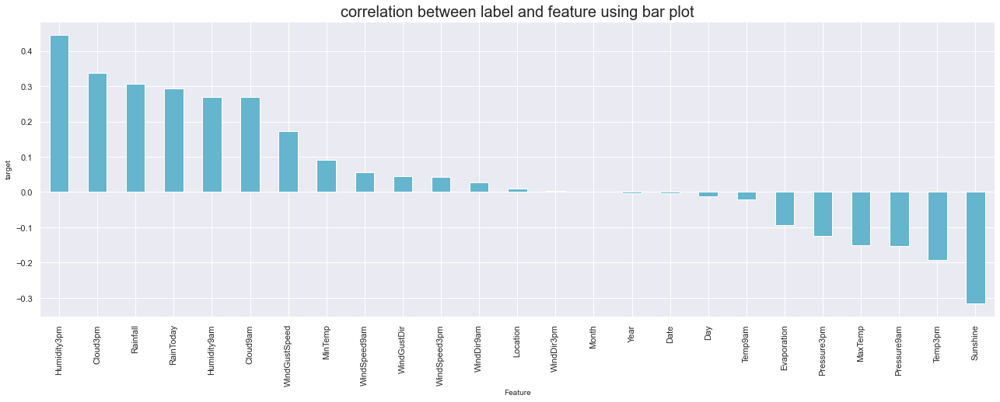

In [154]:
plt.figure(figsize=(22,7))
df_new.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=10)
plt.ylabel('target',fontsize=10)
plt.title('correlation between label and feature using bar plot',fontsize=20)
plt.show()

from above we can see Our target Raintomorrow is highly correlated with humidity 3pm followed by cloud 3pm. Rain tomorrow is least correlated with year, month and wind direction at 3pm.

# Separating the features and label into x & y:-

In [155]:
x=df_new.drop("RainTomorrow",axis=1)
y=df_new["RainTomorrow"]

In [156]:
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,0.0,1.0,13.4,22.900000,0.572706,0.033069,-0.097439,13.0,0.448790,13.0,...,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0.0,2008,12,1
1,1.0,1.0,7.4,25.100000,-1.061985,0.033069,-0.097439,14.0,0.448790,6.0,...,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0.0,2008,12,2
2,2.0,1.0,12.9,25.700000,-1.061985,0.033069,-0.097439,15.0,0.593637,13.0,...,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0.0,2008,12,3
3,3.0,1.0,9.2,28.000000,-1.061985,0.033069,-0.097439,4.0,-1.250093,9.0,...,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0.0,2008,12,4
4,4.0,1.0,17.5,32.300000,0.758751,0.033069,-0.097439,13.0,0.224831,1.0,...,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2931.0,9.0,2.8,23.400000,-1.061985,0.033069,-0.097439,0.0,-0.591948,9.0,...,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0.0,2017,6,21
8421,2932.0,9.0,3.6,25.300000,-1.061985,0.033069,-0.097439,6.0,-1.456067,9.0,...,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0.0,2017,6,22
8422,2933.0,9.0,5.4,26.900000,-1.061985,0.033069,-0.097439,3.0,-0.087700,9.0,...,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0.0,2017,6,23
8423,2934.0,9.0,7.8,27.000000,-1.061985,0.033069,-0.097439,9.0,-0.863369,10.0,...,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0.0,2017,6,24


In [157]:
y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: RainTomorrow, Length: 7987, dtype: float64

In [158]:
x.shape

(7987, 25)

In [159]:
y.shape

(7987,)

# Scaling the data using standard scaler:-

In [160]:
from sklearn.preprocessing import StandardScaler

In [161]:
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.530550,-1.508427,0.056444,-0.145732,1.142269,0.033069,-0.097439,1.229267,0.448790,1.250245,...,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-1.661315,1.634113,-1.671657
1,-1.529355,-1.508427,-1.058476,0.220676,-0.690128,0.033069,-0.097439,1.441960,0.448790,-0.277857,...,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476,-1.661315,1.634113,-1.557976
2,-1.528159,-1.508427,-0.036466,0.320605,-0.690128,0.033069,-0.097439,1.654654,0.593637,1.250245,...,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476,-1.661315,1.634113,-1.444296
3,-1.526963,-1.508427,-0.724000,0.703668,-0.690128,0.033069,-0.097439,-0.684977,-1.250093,0.377044,...,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476,-1.661315,1.634113,-1.330616
4,-1.525768,-1.508427,0.818306,1.419829,1.350816,0.033069,-0.097439,1.229267,0.224831,-1.369358,...,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476,-1.661315,1.634113,-1.216936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.974004,1.029423,-1.913248,-0.062457,-0.690128,0.033069,-0.097439,-1.535751,-0.591948,0.377044,...,1.137532,0.829435,0.011773,0.013138,-1.358595,0.004208,-0.542476,2.004134,-0.123726,0.601949
7983,1.975200,1.029423,-1.764592,0.253986,-0.690128,0.033069,-0.097439,-0.259589,-1.456067,0.377044,...,0.953678,0.626930,0.011773,0.013138,-1.215007,0.364014,-0.542476,2.004134,-0.123726,0.715629
7984,1.976395,1.029423,-1.430116,0.520464,-0.690128,0.033069,-0.097439,-0.897670,-0.087700,0.377044,...,0.535827,0.238796,0.011773,0.013138,-0.927832,0.638152,-0.542476,2.004134,-0.123726,0.829310
7985,1.977591,1.029423,-0.984148,0.537119,-0.690128,0.033069,-0.097439,0.378492,-0.863369,0.595344,...,0.268402,0.188170,-0.633229,-1.076661,-0.461172,0.621019,-0.542476,2.004134,-0.123726,0.942990


In [162]:
x.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Year,Month,Day
0,-1.530550,-1.508427,0.056444,-0.145732,1.142269,0.033069,-0.097439,1.229267,0.448790,1.250245,...,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-1.661315,1.634113,-1.671657
1,-1.529355,-1.508427,-1.058476,0.220676,-0.690128,0.033069,-0.097439,1.441960,0.448790,-0.277857,...,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476,-1.661315,1.634113,-1.557976
2,-1.528159,-1.508427,-0.036466,0.320605,-0.690128,0.033069,-0.097439,1.654654,0.593637,1.250245,...,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476,-1.661315,1.634113,-1.444296
3,-1.526963,-1.508427,-0.724000,0.703668,-0.690128,0.033069,-0.097439,-0.684977,-1.250093,0.377044,...,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476,-1.661315,1.634113,-1.330616
4,-1.525768,-1.508427,0.818306,1.419829,1.350816,0.033069,-0.097439,1.229267,0.224831,-1.369358,...,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476,-1.661315,1.634113,-1.216936


Our data is scaled

# Multicollinearity:-

In [170]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [171]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3246.247559,Date
1,1.828571,Location
2,4.887155,MinTemp
3,5.865576,MaxTemp
4,4.784456,Rainfall
5,1.614860,Evaporation
6,2.060683,Sunshine
7,1.622888,WindGustDir
8,2.249639,WindGustSpeed
9,1.377070,WindDir9am


We can see that we have high multicolinearity in: MaxTemp, Pressure9am, Pressure3pm, Temp9am, Temp3pm.

In [ ]:
x.drop("Temp3pm",axis=1,inplace=True)
x.drop("Temp9am",axis=1,inplace=True)

In [168]:
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,RainToday,Year,Month,Day
0,-1.530550,-1.508427,0.056444,-0.145732,1.142269,0.033069,-0.097439,1.229267,0.448790,1.250245,...,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.542476,-1.661315,1.634113,-1.671657
1,-1.529355,-1.508427,-1.058476,0.220676,-0.690128,0.033069,-0.097439,1.441960,0.448790,-0.277857,...,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.542476,-1.661315,1.634113,-1.557976
2,-1.528159,-1.508427,-0.036466,0.320605,-0.690128,0.033069,-0.097439,1.654654,0.593637,1.250245,...,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,-0.542476,-1.661315,1.634113,-1.444296
3,-1.526963,-1.508427,-0.724000,0.703668,-0.690128,0.033069,-0.097439,-0.684977,-1.250093,0.377044,...,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,-0.542476,-1.661315,1.634113,-1.330616
4,-1.525768,-1.508427,0.818306,1.419829,1.350816,0.033069,-0.097439,1.229267,0.224831,-1.369358,...,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,-0.542476,-1.661315,1.634113,-1.216936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.974004,1.029423,-1.913248,-0.062457,-0.690128,0.033069,-0.097439,-1.535751,-0.591948,0.377044,...,-1.030114,-1.513226,1.137532,0.829435,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.601949
7983,1.975200,1.029423,-1.764592,0.253986,-0.690128,0.033069,-0.097439,-0.259589,-1.456067,0.377044,...,-0.726555,-1.679648,0.953678,0.626930,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.715629
7984,1.976395,1.029423,-1.430116,0.520464,-0.690128,0.033069,-0.097439,-0.897670,-0.087700,0.377044,...,-0.908690,-1.513226,0.535827,0.238796,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.829310
7985,1.977591,1.029423,-0.984148,0.537119,-0.690128,0.033069,-0.097439,0.378492,-0.863369,0.595344,...,-1.030114,-1.513226,0.268402,0.188170,-0.633229,-1.076661,-0.542476,2.004134,-0.123726,0.942990


In [167]:
vif

,VIF values,Features
0,3263.886380,Date
1,1.829021,Location
2,9.085761,MinTemp
3,26.409630,MaxTemp
4,4.785579,Rainfall
5,1.619779,Evaporation
6,2.070757,Sunshine
7,1.627487,WindGustDir
8,2.300996,WindGustSpeed
9,1.378245,WindDir9am


In [173]:
x.drop("Pressure9am",axis=1,inplace=True)

In [174]:
x

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,Year,Month,Day
0,-1.530550,-1.508427,0.056444,-0.145732,1.142269,0.033069,-0.097439,1.229267,0.448790,1.250245,...,0.638072,0.184123,-1.624174,-1.398115,1.425345,0.013138,-0.542476,-1.661315,1.634113,-1.671657
1,-1.529355,-1.508427,-1.058476,0.220676,-0.690128,0.033069,-0.097439,1.441960,0.448790,-0.277857,...,0.421555,-1.455097,-1.457752,-1.279988,0.011773,0.013138,-0.542476,-1.661315,1.634113,-1.557976
2,-1.528159,-1.508427,-0.036466,0.320605,-0.690128,0.033069,-0.097439,1.654654,0.593637,1.250245,...,0.854590,-1.819368,-1.180382,-1.128109,0.011773,-1.076661,-0.542476,-1.661315,1.634113,-1.444296
3,-1.526963,-1.508427,-0.724000,0.703668,-0.690128,0.033069,-0.097439,-0.684977,-1.250093,0.377044,...,-0.985811,-1.394385,-1.957019,-0.436219,0.011773,0.013138,-0.542476,-1.661315,1.634113,-1.330616
4,-1.525768,-1.508427,0.818306,1.419829,1.350816,0.033069,-0.097439,1.229267,0.224831,-1.369358,...,0.205037,0.851954,-1.013959,-1.583744,1.013630,1.535531,-0.542476,-1.661315,1.634113,-1.216936
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.974004,1.029423,-1.913248,-0.062457,-0.690128,0.033069,-0.097439,-1.535751,-0.591948,0.377044,...,-0.769293,-1.030114,-1.513226,0.829435,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.601949
7983,1.975200,1.029423,-1.764592,0.253986,-0.690128,0.033069,-0.097439,-0.259589,-1.456067,0.377044,...,-0.985811,-0.726555,-1.679648,0.626930,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.715629
7984,1.976395,1.029423,-1.430116,0.520464,-0.690128,0.033069,-0.097439,-0.897670,-0.087700,0.377044,...,-0.985811,-0.908690,-1.513226,0.238796,0.011773,0.013138,-0.542476,2.004134,-0.123726,0.829310
7985,1.977591,1.029423,-0.984148,0.537119,-0.690128,0.033069,-0.097439,0.378492,-0.863369,0.595344,...,-1.202329,-1.030114,-1.513226,0.188170,-0.633229,-1.076661,-0.542476,2.004134,-0.123726,0.942990


In [175]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,3233.969673,Date
1,1.826868,Location
2,4.693541,MinTemp
3,5.624637,MaxTemp
4,4.777793,Rainfall
5,1.599428,Evaporation
6,2.053250,Sunshine
7,1.606993,WindGustDir
8,2.232874,WindGustSpeed
9,1.352979,WindDir9am


In [176]:
y.value_counts()

0.0    6165
1.0    1822
Name: RainTomorrow, dtype: int64

The data is not balanced, so we have to balance the data by over sampling.

# SMOTE Technique:-

In [177]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()
x,y = smt.fit_resample(x,y)

0.0    6165
1.0    6165
Name: RainTomorrow, dtype: int64


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

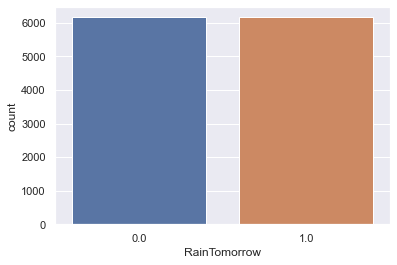

In [178]:
print(y.value_counts())
sns.countplot(y)

Oversampling has been fixed

# Finding Best Random State and Accuracy:-

In [179]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [180]:
maxAccu=0           #max accuracy    
maxRS=0             #for best ranom state value for wuich max accuracy is acheived
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)        #fitting the data 
    pred = DTC.predict(x_test)        #predicted target variable
    acc=accuracy_score(y_test, pred)
    print('accuracy : ',acc,'random state :',i)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i

accuracy :  0.8675317653419843 random state : 1
accuracy :  0.8683427953500946 random state : 2
accuracy :  0.8734793187347932 random state : 3
accuracy :  0.8648283319816167 random state : 4
accuracy :  0.8591511219248446 random state : 5
accuracy :  0.8529332251959989 random state : 6
accuracy :  0.8642876453095432 random state : 7
accuracy :  0.8705055420383887 random state : 8
accuracy :  0.8751013787510138 random state : 9
accuracy :  0.8683427953500946 random state : 10
accuracy :  0.8640173019735063 random state : 11
accuracy :  0.8661800486618005 random state : 12
accuracy :  0.8667207353338741 random state : 13
accuracy :  0.8710462287104623 random state : 14
accuracy :  0.8723979453906461 random state : 15
accuracy :  0.8734793187347932 random state : 16
accuracy :  0.8769937821032712 random state : 17
accuracy :  0.8659097053257637 random state : 18
accuracy :  0.8732089753987564 random state : 19
accuracy :  0.869153825358205 random state : 20
accuracy :  0.8680724520140578

In [181]:
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8826709921600433  on Random_state  184


# Creating train test split:-

In [182]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

# importing libraries:-

In [183]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

# DecisionTreeClassifier:-

In [184]:
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC = DTC.predict(x_test)   #prediction

print('accuracy is :-',accuracy_score(y_test, predDTC))
print(confusion_matrix(y_test, predDTC))
print(classification_report(y_test,predDTC))

accuracy is :- 0.8805082454717491
[[1627  231]
 [ 211 1630]]
              precision    recall  f1-score   support

         0.0       0.89      0.88      0.88      1858
         1.0       0.88      0.89      0.88      1841

    accuracy                           0.88      3699
   macro avg       0.88      0.88      0.88      3699
weighted avg       0.88      0.88      0.88      3699



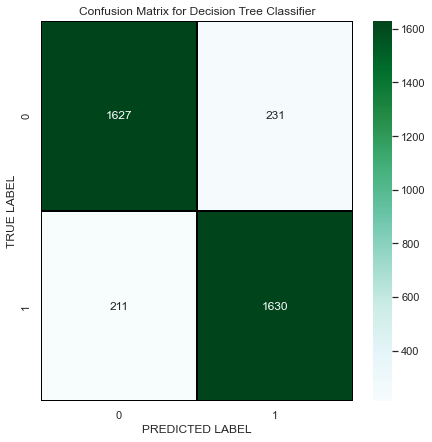

In [185]:
cm = confusion_matrix(y_test,predDTC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()

# Random Forest Classifier:-

In [186]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
# Prediction
predRFC = RFC.predict(x_test)

print('accuracy is :-',accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

accuracy is :- 0.9332251959989186
[[1724  134]
 [ 113 1728]]
              precision    recall  f1-score   support

         0.0       0.94      0.93      0.93      1858
         1.0       0.93      0.94      0.93      1841

    accuracy                           0.93      3699
   macro avg       0.93      0.93      0.93      3699
weighted avg       0.93      0.93      0.93      3699



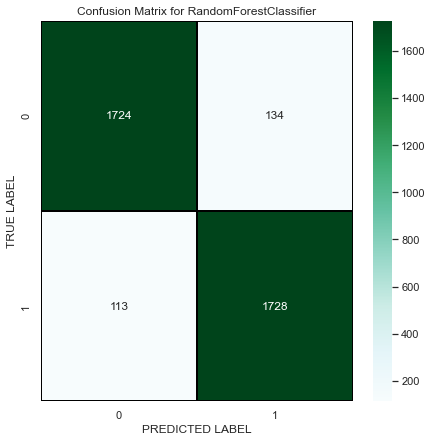

In [187]:
cm = confusion_matrix(y_test,predRFC)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f,ax=plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# Logistic Regression:-

In [188]:
LR = LogisticRegression()
LR.fit(x_train,y_train)
# Prediction
predLR = LR.predict(x_test)

print('Accuracy is :-',accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test,predLR))

Accuracy is :- 0.7842660178426601
[[1477  381]
 [ 417 1424]]
              precision    recall  f1-score   support

         0.0       0.78      0.79      0.79      1858
         1.0       0.79      0.77      0.78      1841

    accuracy                           0.78      3699
   macro avg       0.78      0.78      0.78      3699
weighted avg       0.78      0.78      0.78      3699



Text(0.5, 1.0, 'Confusion Matrix for Logistic Regression Classifier')

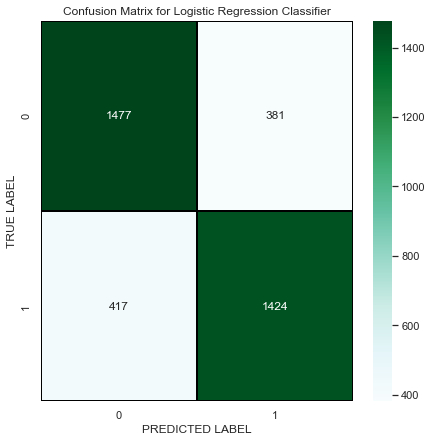

In [189]:
cm = confusion_matrix(y_test,predLR)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f,ax=plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')

# KNeighbors Classifier:-

In [190]:
knn = KNN()
knn.fit(x_train,y_train)

# Prediction
predknn = knn.predict(x_test)

print('Accuracy is:-',accuracy_score(y_test, predknn))
print(confusion_matrix(y_test, predknn))
print(classification_report(y_test,predknn))

Accuracy is:- 0.8564476885644768
[[1391  467]
 [  64 1777]]
              precision    recall  f1-score   support

         0.0       0.96      0.75      0.84      1858
         1.0       0.79      0.97      0.87      1841

    accuracy                           0.86      3699
   macro avg       0.87      0.86      0.85      3699
weighted avg       0.87      0.86      0.85      3699



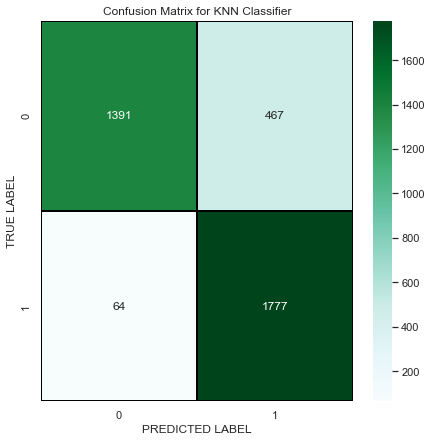

In [191]:
cm = confusion_matrix(y_test,predknn)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for KNN Classifier')
plt.show()

# Gradient Boosting Classifier:-

In [192]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

print('Accuracy is :- ',accuracy_score(y_test, predGB))
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

Accuracy is :-  0.8637469586374696
[[1617  241]
 [ 263 1578]]
              precision    recall  f1-score   support

         0.0       0.86      0.87      0.87      1858
         1.0       0.87      0.86      0.86      1841

    accuracy                           0.86      3699
   macro avg       0.86      0.86      0.86      3699
weighted avg       0.86      0.86      0.86      3699



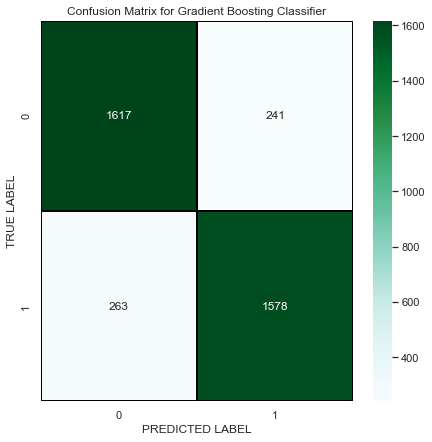

In [193]:
cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="BuGn",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# Cross Validation:-

In [194]:
from sklearn.model_selection import cross_val_score

In [200]:
scr=cross_val_score(LR,x,y,cv=10)
print('Cross Validation score of Logistic Regression model : ',scr.mean())

Cross Validation score of Logistic Regression model :  0.7323600973236009


In [201]:
scr2=cross_val_score(DTC,x,y,cv=10)
print('Cross Validation score of Decision tree model : ',scr2.mean())

Cross Validation score of Decision tree model :  0.8031630170316302


In [202]:
scr3=cross_val_score(RFC,x,y,cv=10)
print('Cross Validation score of Random Forest model : ',scr3.mean())

Cross Validation score of Random Forest model :  0.8656934306569344


In [203]:
scr4=cross_val_score(knn,x,y,cv=10)
print('Cross Validation score of KNN model : ',scr4.mean())

Cross Validation score of KNN model :  0.7820762368207624


In [199]:
scr5=cross_val_score(GB,x,y,cv=10)
print('Cross Validation score of GB model : ',scr5.mean())

Cross Validation score of GB model :  0.6798053527980535


# Hyper Parameter tuning:-

In [204]:
from sklearn.model_selection import GridSearchCV

In [205]:
from sklearn.model_selection import GridSearchCV
parameters={'max_features':['auto','sqrt','log2'],
            'max_depth':[15,20,25,35],
            'n_estimators':[100,200,300,400],
            'criterion':['gini','entropy']}

In [208]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=10)

In [209]:
GCV.fit(x_train,y_train)
GCV.best_params_

{'criterion': 'entropy',
 'max_depth': 35,
 'max_features': 'sqrt',
 'n_estimators': 400}

In [210]:
Final_mod=RandomForestClassifier(criterion='entropy',max_depth=35, max_features='sqrt', n_estimators=400)
Final_mod.fit(x_train,y_train)
pred=Final_mod.predict(x_test)
acc=accuracy_score(y_test, pred)
print(acc*100)

93.45769126791025


its tune upto 1-2%

So here the RFC is best model with an accuracy of 93.45% after tunning.

# ROC-AUC curve:-

In [211]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

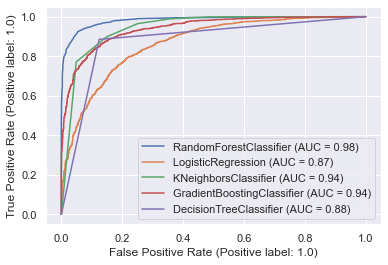

In [212]:
disp=plot_roc_curve(RFC,x_test,y_test)
# ax_=Axes with confusion matrix
plot_roc_curve(LR, x_test, y_test, ax=disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plt.legend(prop={'size':11}, loc='lower right')
plt.show()

we can see AUC score of Random forest classifier is 98%

# Saving the model:-

In [214]:
import joblib
joblib.dump(Final_mod,"rainfall_Prediction_1.pkl")

['rainfall_Prediction_1.pkl']

# Lets Predicting the saved model:-

In [215]:
model=joblib.load("rainfall_Prediction_1.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0., 1., 1., ..., 1., 0., 1.])

In [216]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T   #T for table format

,Predicted,Original
0,0.0,0.0
1,1.0,0.0
2,1.0,1.0
3,1.0,1.0
4,0.0,0.0
...,...,...
3694,1.0,1.0
3695,1.0,1.0
3696,1.0,1.0
3697,0.0,0.0


it looks like all the actual and predicted values are almost same.

# ii) predict how much rainfall could be there.

In [217]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2008-12-01,Albury,13.4,22.900000,0.6,4.6,7.632205,W,44.0,W,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1
1,2008-12-02,Albury,7.4,25.100000,0.0,4.6,7.632205,WNW,44.0,NNW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,2
2,2008-12-03,Albury,12.9,25.700000,0.0,4.6,7.632205,WSW,46.0,W,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,3
3,2008-12-04,Albury,9.2,28.000000,0.0,4.6,7.632205,NE,24.0,SE,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,4
4,2008-12-05,Albury,17.5,32.300000,1.0,4.6,7.632205,W,41.0,ENE,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,4.6,7.632205,E,31.0,SE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,21
8421,2017-06-22,Uluru,3.6,25.300000,0.0,4.6,7.632205,NNW,22.0,SE,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,22
8422,2017-06-23,Uluru,5.4,26.900000,0.0,4.6,7.632205,N,37.0,SE,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,23
8423,2017-06-24,Uluru,7.8,27.000000,0.0,4.6,7.632205,SE,28.0,SSE,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [223]:
df=df.drop(['Date'],axis=1)

In [224]:
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.900000,0.6,4.6,7.632205,W,44.0,W,WNW,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.100000,0.0,4.6,7.632205,WNW,44.0,NNW,WSW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.700000,0.0,4.6,7.632205,WSW,46.0,W,WSW,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.000000,0.0,4.6,7.632205,NE,24.0,SE,E,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.300000,1.0,4.6,7.632205,W,41.0,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,4.6,7.632205,E,31.0,SE,ENE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.300000,0.0,4.6,7.632205,NNW,22.0,SE,N,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.900000,0.0,4.6,7.632205,N,37.0,SE,WNW,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.000000,0.0,4.6,7.632205,SE,28.0,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [226]:
cat_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [227]:
num_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        num_col.append(i)
print(num_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Year', 'Month', 'Day']


# Checking Outliers:-

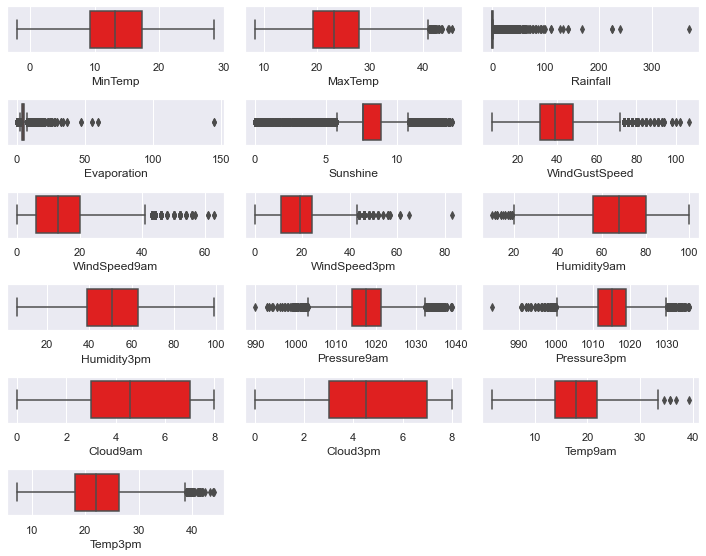

In [228]:
plt.figure(figsize=(10,10),facecolor='white')
plotnumber=1
for column in numerical_columns:
    if plotnumber<=24:
        ax=plt.subplot(8,3,plotnumber)
        sns.boxplot(df[column],color="red")
        plt.xlabel(column,fontsize=12)
    plotnumber+=1
plt.tight_layout()

As we can see there re lots of outliers present inside the dataset

# Removing outliers:-

In [230]:
Features=df[['MaxTemp','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

In [229]:
from scipy.stats import zscore

In [233]:
z=np.abs(zscore(Features))
df_new=df[(z<3).all(axis=1)]
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.900000,0.6,4.6,7.632205,W,44.0,W,WNW,...,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.100000,0.0,4.6,7.632205,WNW,44.0,NNW,WSW,...,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.700000,0.0,4.6,7.632205,WSW,46.0,W,WSW,...,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.000000,0.0,4.6,7.632205,NE,24.0,SE,E,...,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.300000,1.0,4.6,7.632205,W,41.0,ENE,NW,...,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,4.6,7.632205,E,31.0,SE,ENE,...,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6,21
8421,Uluru,3.6,25.300000,0.0,4.6,7.632205,NNW,22.0,SE,N,...,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6,22
8422,Uluru,5.4,26.900000,0.0,4.6,7.632205,N,37.0,SE,WNW,...,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6,23
8423,Uluru,7.8,27.000000,0.0,4.6,7.632205,SE,28.0,SSE,N,...,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6,24


In [234]:
df.shape

(8425, 25)

In [236]:
df_new.shape

(8095, 25)

we can clearly see that some data are removing from previous dataset

# % of data loss:-

In [237]:
loss=(((8425-8095)/8425)*100)
loss

3.9169139465875373

we can see we lost 3.91% of data as outliers using Zscore method

# Checking for skewness:-

In [238]:
df_new.skew()

MinTemp          -0.094538
MaxTemp           0.321781
Rainfall         13.877750
Evaporation       1.281752
Sunshine         -0.729992
WindGustSpeed     0.542084
WindSpeed9am      0.714718
WindSpeed3pm      0.301024
Humidity9am      -0.237214
Humidity3pm       0.125872
Pressure9am       0.024754
Pressure3pm       0.047523
Cloud9am         -0.364928
Cloud3pm         -0.273745
Temp9am          -0.038715
Temp3pm           0.341420
Year              0.430854
Month             0.059034
Day               0.005967
dtype: float64

As we can see there is skeness on  Evaporation", "Sunshine", "WindGustSpeed", "WindSpeed9am" these columns

# Removing skewness:-

In [239]:
skew=[ "Evaporation", "Sunshine", "WindGustSpeed", "WindSpeed9am"]

In [240]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
df_new[skew] = scaler.fit_transform(df_new[skew].values)

In [241]:
df_new.skew()

MinTemp          -0.094538
MaxTemp           0.321781
Rainfall         13.877750
Evaporation       0.062599
Sunshine         -0.078349
WindGustSpeed     0.004802
WindSpeed9am     -0.110412
WindSpeed3pm      0.301024
Humidity9am      -0.237214
Humidity3pm       0.125872
Pressure9am       0.024754
Pressure3pm       0.047523
Cloud9am         -0.364928
Cloud3pm         -0.273745
Temp9am          -0.038715
Temp3pm           0.341420
Year              0.430854
Month             0.059034
Day               0.005967
dtype: float64

As we can see all those skewness are in +/-5 range except rainfall.
Here rainfall is our target column soo there is no need to remove skewness

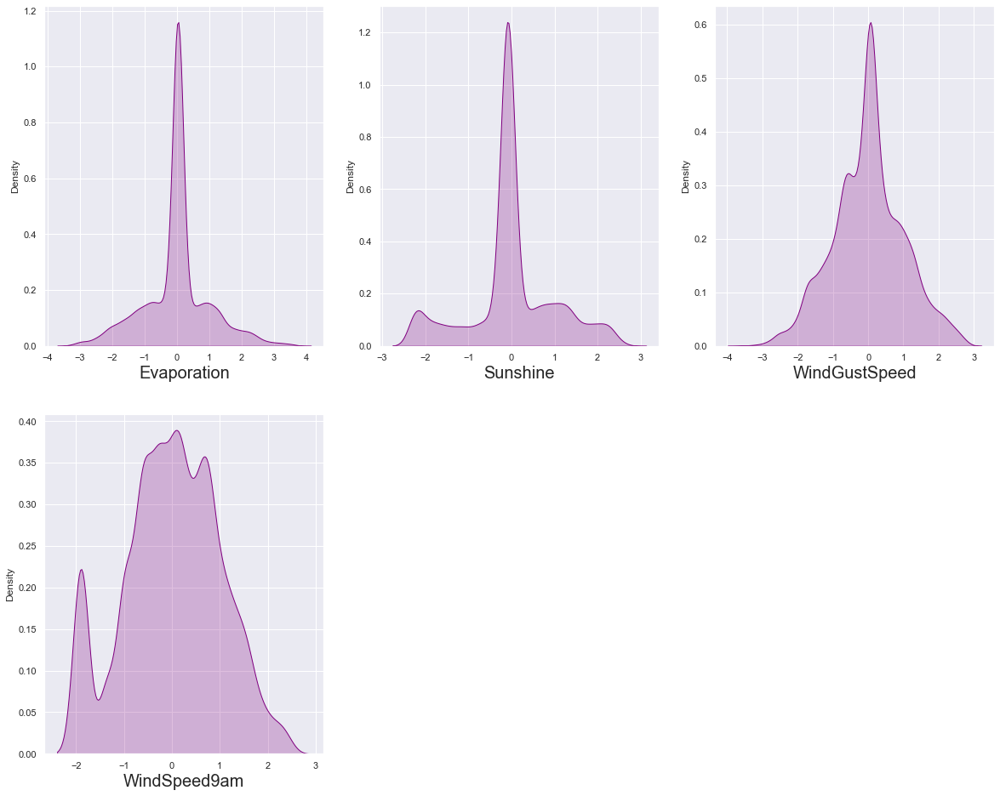

In [242]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df_new[skew]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df_new[column],color='purple',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

Here the data looks almost normal and has no skewness.

# Encoding the data:-

In [243]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [245]:
for i in cat_col:
    df_new[i]=enc.fit_transform(df_new[i].values.reshape(-1,1))

In [246]:
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,1.0,13.4,22.900000,0.6,0.031907,-0.084473,13.0,0.444328,13.0,14.0,...,1007.1,8.000000,4.503183,16.9,21.8,0.0,0.0,2008,12,1
1,1.0,7.4,25.100000,0.0,0.031907,-0.084473,14.0,0.444328,6.0,15.0,...,1007.8,4.566622,4.503183,17.2,24.3,0.0,0.0,2008,12,2
2,1.0,12.9,25.700000,0.0,0.031907,-0.084473,15.0,0.589170,13.0,15.0,...,1008.7,4.566622,2.000000,21.0,23.2,0.0,0.0,2008,12,3
3,1.0,9.2,28.000000,0.0,0.031907,-0.084473,4.0,-1.255041,9.0,0.0,...,1012.8,4.566622,4.503183,18.1,26.5,0.0,0.0,2008,12,4
4,1.0,17.5,32.300000,1.0,0.031907,-0.084473,13.0,0.220363,1.0,7.0,...,1006.0,7.000000,8.000000,17.8,29.7,0.0,0.0,2008,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.400000,0.0,0.031907,-0.084473,0.0,-0.596582,9.0,1.0,...,1020.3,4.566622,4.503183,10.1,22.4,0.0,0.0,2017,6,21
8421,9.0,3.6,25.300000,0.0,0.031907,-0.084473,6.0,-1.461149,9.0,3.0,...,1019.1,4.566622,4.503183,10.9,24.5,0.0,0.0,2017,6,22
8422,9.0,5.4,26.900000,0.0,0.031907,-0.084473,3.0,-0.092204,9.0,14.0,...,1016.8,4.566622,4.503183,12.5,26.1,0.0,0.0,2017,6,23
8423,9.0,7.8,27.000000,0.0,0.031907,-0.084473,9.0,-0.868112,10.0,3.0,...,1016.5,3.000000,2.000000,15.1,26.0,0.0,0.0,2017,6,24


# Checking correlation:-

In [248]:
cor=df_new.corr()

In [249]:
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
Location,1.000000,0.112020,0.060569,0.001163,0.110600,0.043188,-0.037417,0.254394,-0.038655,-0.028622,...,-0.009228,0.040491,0.024564,0.113606,0.057378,0.001900,0.005620,0.483028,-0.085405,-0.005574
MinTemp,0.112020,1.000000,0.715527,0.089009,0.390106,0.078010,-0.153312,0.249476,-0.043406,-0.155134,...,-0.426595,0.096184,0.043581,0.887828,0.684359,0.072772,0.097085,0.037568,-0.248316,0.009726
MaxTemp,0.060569,0.715527,1.000000,-0.083858,0.486081,0.400260,-0.235936,0.147772,-0.217509,-0.191687,...,-0.414642,-0.252614,-0.247465,0.863943,0.974833,-0.220169,-0.150898,0.117680,-0.163860,0.016155
Rainfall,0.001163,0.089009,-0.083858,1.000000,-0.044171,-0.158223,0.034949,0.076277,0.089969,0.034851,...,-0.011498,0.180878,0.150671,-0.002799,-0.087749,0.460519,0.216988,0.003416,-0.023102,-0.013951
Evaporation,0.110600,0.390106,0.486081,-0.044171,1.000000,0.405878,-0.111677,0.195821,-0.092123,-0.037519,...,-0.280545,-0.130506,-0.161161,0.464720,0.471074,-0.166639,-0.091700,0.102953,-0.041437,0.011218
Sunshine,0.043188,0.078010,0.400260,-0.158223,0.405878,1.000000,-0.112561,0.025577,-0.084572,-0.071883,...,-0.071808,-0.547470,-0.557970,0.278971,0.415488,-0.236940,-0.321344,0.029183,0.002032,0.004273
WindGustDir,-0.037417,-0.153312,-0.235936,0.034949,-0.111677,-0.112561,1.000000,0.011613,0.404689,0.507185,...,-0.010388,0.121865,0.092719,-0.184448,-0.247918,0.120523,0.042947,-0.094366,0.038607,0.018309
WindGustSpeed,0.254394,0.249476,0.147772,0.076277,0.195821,0.025577,0.011613,1.000000,-0.058899,0.082676,...,-0.328300,0.014778,0.064053,0.217792,0.113118,0.082734,0.177097,-0.031136,0.044598,-0.006114
WindDir9am,-0.038655,-0.043406,-0.217509,0.089969,-0.092123,-0.084572,0.404689,-0.058899,1.000000,0.245617,...,0.081765,0.095530,0.063381,-0.102193,-0.224366,0.154400,0.031332,-0.031335,0.017147,-0.011455
WindDir3pm,-0.028622,-0.155134,-0.191687,0.034851,-0.037519,-0.071883,0.507185,0.082676,0.245617,1.000000,...,-0.036654,0.072076,0.051984,-0.174254,-0.203442,0.099331,0.003747,-0.006997,0.030603,-0.000384


<AxesSubplot:>

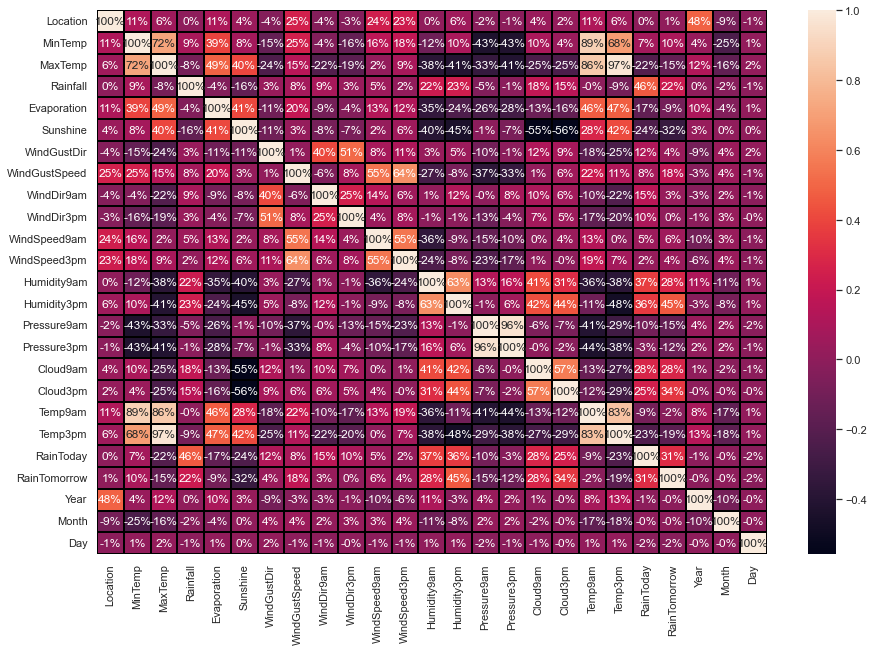

In [251]:
plt.figure(figsize=(15,10))
sns.heatmap(df_new.corr(),annot=True,linewidth=0.01,linecolor='black',fmt='0.0%')

Here we can observe that Our target Rainfall is highly correlated with RainToday and followed by Humidity 9am and Humidity 3pm.

In [252]:
cor['Rainfall'].sort_values(ascending=False)

Rainfall         1.000000
RainToday        0.460519
Humidity3pm      0.233657
Humidity9am      0.222707
RainTomorrow     0.216988
Cloud9am         0.180878
Cloud3pm         0.150671
WindDir9am       0.089969
MinTemp          0.089009
WindGustSpeed    0.076277
WindSpeed9am     0.052271
WindGustDir      0.034949
WindDir3pm       0.034851
WindSpeed3pm     0.019364
Year             0.003416
Location         0.001163
Temp9am         -0.002799
Pressure3pm     -0.011498
Day             -0.013951
Month           -0.023102
Evaporation     -0.044171
Pressure9am     -0.051908
MaxTemp         -0.083858
Temp3pm         -0.087749
Sunshine        -0.158223
Name: Rainfall, dtype: float64

# Visualizing correlation using bar plot:-

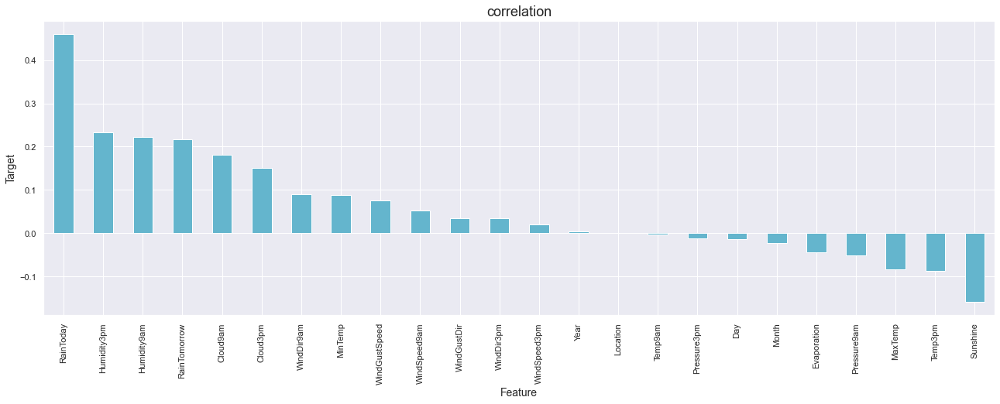

In [253]:
plt.figure(figsize=(22,7))
df_new.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

here e can see year,location have least correlation with out target column

# Separating the features and label:-

In [285]:
x=df_new.drop("Rainfall",axis=1)
y=df_new["Rainfall"]

In [286]:
x.shape

(8095, 24)

In [287]:
y.shape

(8095,)

# Scaling the data using standard scaler:-

In [257]:
from sklearn.preprocessing import StandardScaler

In [288]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X=pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [289]:
X

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,-1.507825,0.049494,-0.142944,0.031907,-0.084473,1.228620,0.444328,1.243871,1.400572,0.781103,...,-1.400080,1.410357,0.002863,-0.139997,-0.095216,-0.558373,-0.553042,-1.659738,1.634617,-1.670812
1,-1.507825,-1.067884,0.224765,0.031907,-0.084473,1.441416,0.444328,-0.282945,1.627116,-0.985924,...,-1.281876,-0.000555,0.002863,-0.085945,0.334508,-0.558373,-0.553042,-1.659738,1.634617,-1.557199
2,-1.507825,-0.043621,0.325049,0.031907,-0.084473,1.654213,0.589170,1.243871,1.627116,0.697109,...,-1.129899,-0.000555,-1.085016,0.598719,0.145430,-0.558373,-0.553042,-1.659738,1.634617,-1.443585
3,-1.507825,-0.732671,0.709472,0.031907,-0.084473,-0.686548,-1.255041,0.371405,-1.771046,-0.066187,...,-0.437560,-0.000555,0.002863,0.076213,0.712666,-0.558373,-0.553042,-1.659738,1.634617,-1.329972
4,-1.507825,0.813035,1.428176,0.031907,-0.084473,1.228620,0.220363,-1.373528,-0.185237,-0.543908,...,-1.585830,0.999417,1.522573,0.022160,1.262713,-0.558373,-0.553042,-1.659738,1.634617,-1.216358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8090,1.029904,-1.924540,-0.059374,0.031907,-0.084473,-1.537733,-0.596582,0.371405,-1.544502,0.143336,...,0.828915,-0.000555,0.002863,-1.365185,0.007918,-0.558373,-0.553042,2.001293,-0.120398,0.601456
8091,1.029904,-1.775556,0.258193,0.031907,-0.084473,-0.260955,-1.461149,0.371405,-1.091414,0.143336,...,0.626279,-0.000555,0.002863,-1.221045,0.368886,-0.558373,-0.553042,2.001293,-0.120398,0.715070
8092,1.029904,-1.440343,0.525618,0.031907,-0.084473,-0.899344,-0.092204,0.371405,1.400572,-0.293406,...,0.237893,-0.000555,0.002863,-0.932766,0.643910,-0.558373,-0.553042,2.001293,-0.120398,0.828683
8093,1.029904,-0.993392,0.542332,0.031907,-0.084473,0.377434,-0.868112,0.589521,-1.091414,0.143336,...,0.187234,-0.644342,-1.085016,-0.464312,0.626721,-0.558373,-0.553042,2.001293,-0.120398,0.942297


# Multicollinearity of VIF :-

In [290]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [291]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif["features"]=X.columns
    print(vif)

In [292]:
vif_calc()

    VIF Factor       features
0     1.598054       Location
1     8.845080        MinTemp
2    26.238557        MaxTemp
3     1.598790    Evaporation
4     2.092265       Sunshine
5     1.611285    WindGustDir
6     2.370233  WindGustSpeed
7     1.362617     WindDir9am
8     1.489074     WindDir3pm
9     1.987651   WindSpeed9am
10    2.007337   WindSpeed3pm
11    4.001774    Humidity9am
12    5.706671    Humidity3pm
13   19.847474    Pressure9am
14   19.036781    Pressure3pm
15    1.957169       Cloud9am
16    1.847204       Cloud3pm
17   17.498336        Temp9am
18   33.086442        Temp3pm
19    1.396066      RainToday
20    1.458452   RainTomorrow
21    1.527218           Year
22    1.153525          Month
23    1.004819            Day


Here we can see highest VIF of Temp9am,Temp3pm,Pressure9am,max temp & Pressure3pm

So we have to drop columns and check vif

In [293]:
X.drop("Pressure9am",axis=1,inplace=True)

In [294]:
vif_calc()

    VIF Factor       features
0     1.598026       Location
1     8.700637        MinTemp
2    26.232686        MaxTemp
3     1.582942    Evaporation
4     2.083591       Sunshine
5     1.599978    WindGustDir
6     2.351871  WindGustSpeed
7     1.343244     WindDir9am
8     1.426022     WindDir3pm
9     1.984197   WindSpeed9am
10    1.996355   WindSpeed3pm
11    3.982459    Humidity9am
12    5.640532    Humidity3pm
13    1.449000    Pressure3pm
14    1.956952       Cloud9am
15    1.846450       Cloud3pm
16   17.317005        Temp9am
17   32.124085        Temp3pm
18    1.381944      RainToday
19    1.454511   RainTomorrow
20    1.526196           Year
21    1.151306          Month
22    1.004005            Day


In [295]:
X.drop("Temp9am",axis=1,inplace=True)

In [296]:
vif_calc()

    VIF Factor       features
0     1.596746       Location
1     5.004292        MinTemp
2    25.643334        MaxTemp
3     1.579692    Evaporation
4     2.077141       Sunshine
5     1.595924    WindGustDir
6     2.327678  WindGustSpeed
7     1.342647     WindDir9am
8     1.426017     WindDir3pm
9     1.964082   WindSpeed9am
10    1.945104   WindSpeed3pm
11    2.647647    Humidity9am
12    4.208100    Humidity3pm
13    1.445707    Pressure3pm
14    1.934006       Cloud9am
15    1.845791       Cloud3pm
16   29.851837        Temp3pm
17    1.377068      RainToday
18    1.454279   RainTomorrow
19    1.505849           Year
20    1.130812          Month
21    1.003705            Day


In [300]:
X.drop("Temp3pm",axis=1,inplace=True)

In [301]:
vif_calc()

    VIF Factor       features
0     1.595375       Location
1     4.547908        MinTemp
2     5.464186        MaxTemp
3     1.579405    Evaporation
4     2.075912       Sunshine
5     1.592040    WindGustDir
6     2.298867  WindGustSpeed
7     1.340420     WindDir9am
8     1.419585     WindDir3pm
9     1.963513   WindSpeed9am
10    1.944985   WindSpeed3pm
11    2.514464    Humidity9am
12    3.162263    Humidity3pm
13    1.445705    Pressure3pm
14    1.934004       Cloud9am
15    1.832221       Cloud3pm
16    1.376704      RainToday
17    1.454102   RainTomorrow
18    1.502378           Year
19    1.124796          Month
20    1.003575            Day


Now we can see multicolinearity is removed completely

# Finding best random state:-

In [270]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [271]:
from sklearn.ensemble import RandomForestRegressor

In [302]:
maxAccu=0
maxRS=0
for i in range(1,100):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    rfc=RandomForestRegressor()
    rfc.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=r2_score(y_test, pred)
    print('accuracy : ',acc,'random state :',i)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

accuracy :  0.7132940401086139 random state : 1
accuracy :  0.3942858905411828 random state : 2
accuracy :  0.784147783048924 random state : 3
accuracy :  0.7329152656650306 random state : 4
accuracy :  0.750212531763826 random state : 5
accuracy :  0.797535273935349 random state : 6
accuracy :  0.6859014283582434 random state : 7
accuracy :  0.7641713591884436 random state : 8
accuracy :  0.7225193408569857 random state : 9
accuracy :  0.6746342389636459 random state : 10
accuracy :  0.7038380960332811 random state : 11
accuracy :  0.7313605272825711 random state : 12
accuracy :  0.7278156701761243 random state : 13
accuracy :  0.7435720609301315 random state : 14
accuracy :  0.748289393869657 random state : 15
accuracy :  0.7436380965956714 random state : 16
accuracy :  0.7631999027962721 random state : 17
accuracy :  0.766645953150321 random state : 18
accuracy :  0.7921253856366124 random state : 19
accuracy :  0.6995727637082505 random state : 20
accuracy :  0.7933698808585152 ran

In [339]:
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8565078402651997  on Random_state  52


# Creating train test split:-

In [340]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

# Regression Algorithms:-

In [341]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn import metrics

# Random Forest Regressor:-

In [343]:
RFR=RandomForestRegressor()
RFR.fit(X_train,y_train)
pred=RFR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.5007865800293829
mean_squared_error: 51.11417517990942
mean_absolute_error: 1.9410078221490328
root_mean_squared_error: 7.149417821047349


# ExtraTreeRegressor:-

In [308]:
ETR=ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred=ETR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.5376080334334332
mean_squared_error: 47.344047726636475
mean_absolute_error: 1.6765887196377118
root_mean_squared_error: 6.880701107200957


# DecisionTreeRegressor:-

In [309]:
DTR=DecisionTreeRegressor()
DTR.fit(X_train,y_train)
pred=DTR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: -0.06037736063365107
mean_squared_error: 108.57142857142857
mean_absolute_error: 2.4522848909016055
root_mean_squared_error: 10.419761445034554


# KNN:-

In [310]:
knn=KNN()
knn.fit(X_train,y_train)
pred=knn.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.23842368506953393
mean_squared_error: 77.97736121860848
mean_absolute_error: 2.306562371346233
root_mean_squared_error: 8.83047910470369


# Gradient Boosting:-

In [311]:
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
pred=GBR.predict(X_test)
print('R2_score:',r2_score(y_test,pred))
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

R2_score: 0.4206599857164939
mean_squared_error: 59.31829112398721
mean_absolute_error: 2.379336791932651
root_mean_squared_error: 7.7018368668770965


# Cross Validation Score:-

In [312]:
#for RandomForestRegressor
print(cross_val_score(RFR,X,y,cv=5).mean())

0.42132287657404877


In [313]:
#for ExtratreeRegressor
print(cross_val_score(ETR,X,y,cv=5).mean())

0.44728699308969644


In [314]:
#for Decisiontree Regressor
print(cross_val_score(DTR,X,y,cv=5).mean())

-0.4021362280531758


In [315]:
#for knn
print(cross_val_score(knn,X,y,cv=5).mean())

0.29138696011765547


In [316]:
#for Gradient boosting
print(cross_val_score(GBR,X,y,cv=5).mean())

0.3762117848659413


From above cross validation it is clear that Random Forest Classifiern is better model here which gave best accuracy among all.as there is less difference between them

# Hyper Parameter tuning:-

In [317]:
from sklearn.model_selection import RandomizedSearchCV

parameters={'min_samples_split':[5,10,15,100],
            'n_estimators':[100,200,300,400],
            'max_depth': [5,6,7,8,10,30],
            'max_features':['sqrt','log2',None]}

g=RandomizedSearchCV(RandomForestRegressor(),param_distributions = parameters,scoring='r2',
                     cv = 5, n_iter = 10, n_jobs=-1)
g.fit(X_train,y_train)
pred_g=g.predict(X_test)
print('The r2 score is:', r2_score(y_test, pred_g))
print("\n The best estimator across ALL searched params:\n", g.best_estimator_)
print("\n The best score across ALL searched params:\n", g.best_score_)
print("\n The best parameters across ALL searched params:\n",g.best_params_)

The r2 score is: 0.4517595861721041

 The best estimator across ALL searched params:
 RandomForestRegressor(max_depth=30, max_features='sqrt', min_samples_split=10,
                      n_estimators=200)

 The best score across ALL searched params:
 0.3486962253610698

 The best parameters across ALL searched params:
 {'n_estimators': 200, 'min_samples_split': 10, 'max_features': 'sqrt', 'max_depth': 30}


In [345]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=63)
Final_model =RandomForestRegressor()
Final_model.fit(X_train,y_train)
pred_= Final_model.predict(X_test)
print('The r2 score is:', r2_score(y_test, pred_))

The r2 score is: 0.6035256160521919


# Saving the model:-

In [347]:
import joblib
joblib.dump(Final_model,"rainfall_prediction_Project.pkl")

['rainfall_prediction_Project.pkl']

# Lets Predicting the saved model:-

In [348]:
model=joblib.load("rainfall_prediction_Project.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([7.074e+00, 6.700e-02, 2.000e-03, ..., 1.140e-01, 7.332e+00,
       3.600e-02])

In [349]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"]).T

,Predicted,Actual
0,7.074,2.4
1,0.067,0.0
2,0.002,0.0
3,0.032,0.0
4,0.008,0.0
...,...,...
2424,5.054,1.8
2425,0.234,0.0
2426,0.114,0.0
2427,7.332,9.6


In [ ]:
this is the predicted and actual value